<a href="https://colab.research.google.com/github/klaasmeinke/CNNs-exoplanet-cartography/blob/main/Classification_Architectures.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd '/content/drive/MyDrive/Thesis'

%run Create_Data.ipynb

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import *
import tensorflow.keras.backend as K

from tabulate import tabulate

keras.backend.set_floatx('float64')
print("num GPUs Avilable: ", len(tf.config.experimental.list_physical_devices('GPU')))

Mounted at /content/drive
/content/drive/MyDrive/Thesis
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Thesis
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Thesis
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Thesis
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Thesis
num GPUs Avilable:  1


#### A function to create human readable confusion matrices

In [ ]:
def print_confusion(model, curves, stypes, val_split = 0.1):
    y_test = stypes[ - int(val_split * len(stypes)): ].reshape(-1,4)
    y_pred = model.predict(curves[- int(val_split * len(curves)):]).reshape(-1,4)

    conf = tf.math.confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1))
    conf /= np.sum(conf, axis = 0)
    conf = np.round(conf, decimals = 2)

    labels = ['Ocean', 'Desert', 'Veget.', 'Clouds']
    headers = np.insert(labels, 0, 'Pred.')

    print(tabulate(np.c_[labels, conf], headers = headers))

### Earth Curves

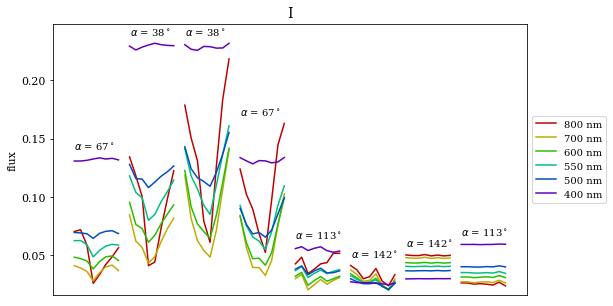

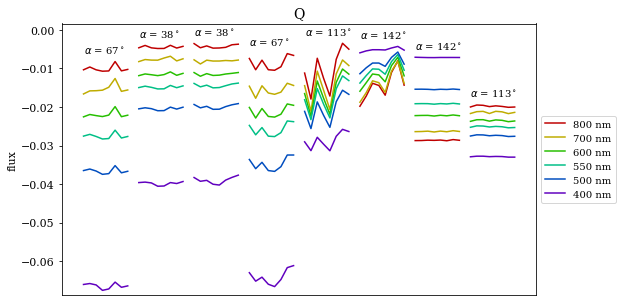

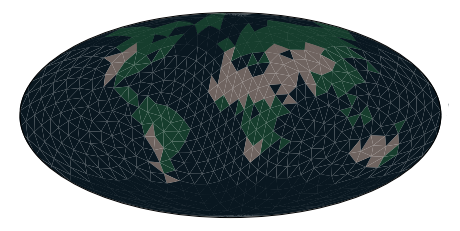

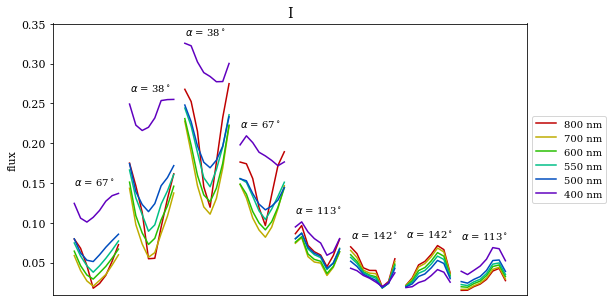

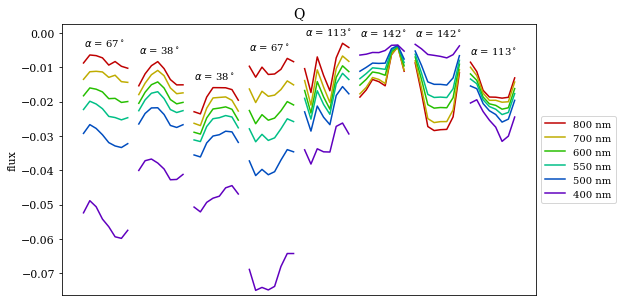

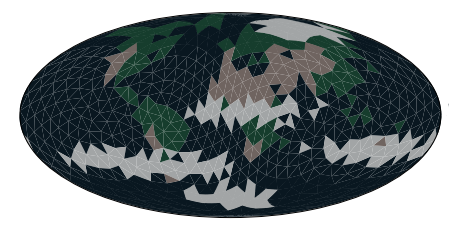

In [ ]:
# # # CREATE CURVES
# c = earth_curves(rot_axis = [0,1,0], incl = 0)
# c2 = earth_curves(rot_axis = [0,1,0], incl = 0, clouds_ind = 21)

# cx = c[:,:,:,:2]
# cx = cx.reshape((1,8,8,12))

# cx2 = c2[:,:,:,:2]
# cx2 = cx2.reshape((1,8,8,12))

# # # MAKE THE MAPS
# sx_true = np.load('data/earth_surface_types.npy')
# sx_true2 = np.maximum(sx_true, clouds[21] * 3)

# # PLOT
# plot_fluxes(c[:,:,:,0], 0)
# plt.title('I')
# plot_fluxes(c[:,:,:,1], 0)
# plt.title('Q')
# mollweide(faces, sx_true)

# print()
# print()

# plot_fluxes(c2[:,:,:,0], 0)
# plt.title('I')
# plot_fluxes(c2[:,:,:,1], 0)
# plt.title('Q')
# mollweide(faces, sx_true2)

In [ ]:
# c2_lamb = earth_curves(rot_axis = [0,1,0], incl = 0, clouds_ind = 21,
#                        fourier = False)

### Convolution Functions

In [ ]:
def conv_curves(x, kernel_size = 1, filters = 1, activation = None):
    idx = tf.constant(list(range(7)) + list(range(kernel_size)))

    x = Lambda(lambda x: tf.gather(x, idx, axis = 2))(x)
    x = Conv2D(filters = filters, kernel_size = (1, kernel_size),
               padding = 'valid', activation = activation)(x)

    return x

In [ ]:
idx_0 = np.array(range(1000))
idx_1 = np.load('data/fib_convolutions/idx_1.npy')
idx_2 = np.load('data/fib_convolutions/idx_2.npy')
idx_3 = np.load('data/fib_convolutions/idx_3.npy')
idx_4 = np.load('data/fib_convolutions/idx_4.npy')
idx_5 = np.load('data/fib_convolutions/idx_5.npy')

def sphere_conv(x, rings = 1, filters = 4, axis = 0, activation = None):
    kernel_size = [1, 13, 37, 72, 118, 174][rings]
    idx = [idx_0, idx_1, idx_2, idx_3, idx_4, idx_5][rings]

    # remove all rows for which the facet is not visible:
    vis = visible_facets(axis_idx = axis)
    bad_idx = np.where(vis == 0)[0]
    good_idx = np.where(vis == 1)[0]

    idx = idx.reshape((1000, kernel_size))
    idx = np.delete(idx, bad_idx, axis = 0)

    # repeat some elements if there are elements that aren't visible in the rows
    idx = np.array([row[[np.where(np.amax(row[None, :ind + 1] == good_idx[:, None],
                                          axis = 0))[0][-1]
                         for ind in range(len(row))]]
                    for row in idx])

    # change the indices to match the new indexing:
    idx = idx.reshape((-1))
    idx -= np.array([np.count_nonzero(vis[:i] == 0) for i in idx])

    x = Lambda(lambda x: tf.gather(x, idx, axis = 1))(x)
    x = Conv1D(filters = filters, kernel_size = kernel_size,
               strides = kernel_size, activation = activation,
               kernel_initializer='zeros', bias_initializer='zeros')(x)

    return x

##### Demonstrating repeating some elements

In [ ]:
# arr = np.array([1,2,3,4,5,6,7,8])

# test = np.array([1,3,5,6,4])

# print(arr[[np.where(np.amax(arr[None, :ind + 1] == test[:, None], axis = 0))[0][-1]
#           for ind in range(len(arr))]])

[1 1 3 4 5 6 6 6]


# Un-Normalize Curves

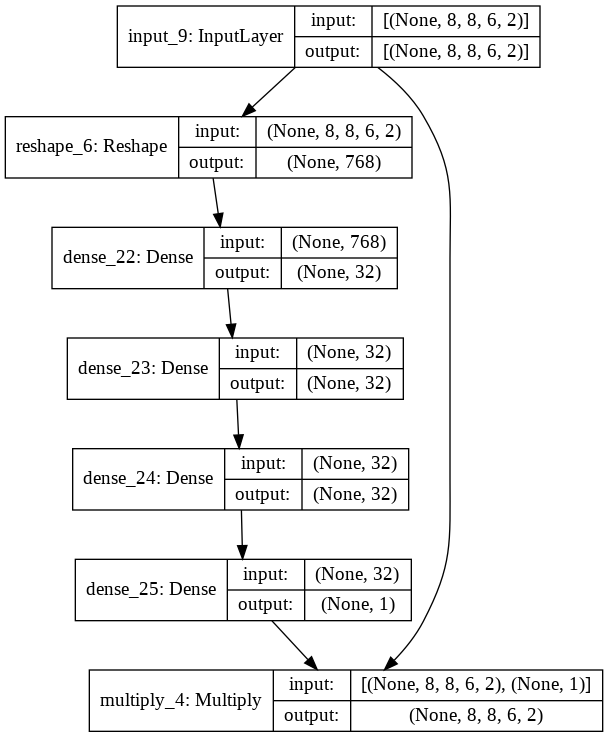

In [ ]:
ip = keras.Input(shape = (8, 8, 6, 2))

y0 = Reshape((768,))(ip)
y1 = Dense(32, activation = 'relu', kernel_initializer = 'zeros')(y0)
y2 = Dense(32, activation = 'relu', kernel_initializer = 'zeros')(y1)
y3 = Dense(32, activation = 'relu', kernel_initializer = 'zeros')(y2)
y4 = Dense(1)(y3)

op = Multiply()([ip, y4])
# x = Add()([x, y4])

unnorm = keras.Model(ip, op)
unnorm.compile(optimizer = 'adam', loss='mean_squared_error')
keras.utils.plot_model(unnorm, show_shapes = True)

In [ ]:
load_data(norm = False, polarization = True, flatten = False, fourier = True)

# signal = norm_and_noise(curves, N_max = 100, polarization = False)
curves = curves.reshape((-1,8,8,6,2))
signal = np.array([normalize(curve, polarization = True) for curve in curves])

unnorm.evaluate(x = signal, y = curves)

unnorm.fit(signal,
           curves,
           epochs=150,
           batch_size=64,
           validation_split=0.1,
           callbacks=[keras.callbacks.EarlyStopping(patience=10)]
           )

curves:  (9054, 8, 8, 12)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
283/283 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 1/150
128/128 [==============================] - 1s 4ms/step - loss: 7.7914e-04 - val_loss: 5.6994e-04
Epoch 2/150
128/128 [==============================] - 0s 4ms/step - loss: 5.7453e-04 - val_loss: 5.6998e-04
Epoch 3/150
128/128 [==============================] - 0s 4ms/step - loss: 5.7458e-04 - val_loss: 5.6993e-04
Epoch 4/150
128/128 [==============================] - 0s 4ms/step - loss: 5.7453e-04 - val_loss: 5.6994e-04
Epoch 5/150
128/128 [==============================] - 0s 3ms/step - loss: 5.7457e-04 - val_loss: 5.6998e-04
Epoch 6/150
128/128 [==============================] - 0s 3ms/step - loss: 5.7457e-04 - val_loss: 5.6996e-04
Epoch 7/150
128/128 [==============================] - 0s 3ms/step - loss: 5.7458e-04 - val_loss: 5.6994e-04
Epoch 8/150
128/128 [==============================] - 0s 3ms/step - loss: 5.7

#### With Polarization:

In [ ]:
ip = keras.Input(shape = (384 * 2, ))

y0 = Dense(32, activation = 'relu')(ip)
y1 = Dense(32, activation = 'relu')(y0)
y2 = Dense(32, activation = 'relu')(y1)
y3 = Dense(1)(y2)
y4 = Dense(1)(y2)

op = Multiply()([ip, y3])
# x = Add()([x, y4])

model = keras.Model(ip, op)
model.compile(optimizer = 'adam', loss='mean_squared_error')

load_data(i = [0, 0.01], y = [0.9, 1], flatten = True, fourier = True,
          norm = False, polarization = True)
non_norm = curves

load_data(i = [0, 0.01], y = [0.9, 1], flatten = True, fourier = True,
          norm = True, polarization = True)
norm = curves

model.fit(
    norm,
    non_norm,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

curves:  (9016, 768)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
curves:  (9016, 768)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
Epoch 1/150
127/127 [==============================] - 1s 4ms/step - loss: 0.0364 - val_loss: 0.0015
Epoch 2/150
127/127 [==============================] - 0s 4ms/step - loss: 0.0013 - val_loss: 9.3736e-04
Epoch 3/150
127/127 [==============================] - 1s 4ms/step - loss: 7.7712e-04 - val_loss: 5.9858e-04
Epoch 4/150
127/127 [==============================] - 0s 4ms/step - loss: 5.6714e-04 - val_loss: 5.2326e-04
Epoch 5/150
127/127 [==============================] - 0s 3ms/step - loss: 4.9668e-04 - val_loss: 4.4663e-04
Epoch 6/150
127/127 [==============================] - 0s 3ms/step - loss: 4.3106e-04 - val_loss: 3.8512e-04
Epoch 7/150
127/127 [==============================] - 0s 3ms/step - loss: 3.8968e-04 - val_loss: 3.3525e-04
Epoch 8/150
127/127 [==============================] - 0s 4ms/step - loss: 3.3896

In [ ]:
pred = np.float16(model.predict(norm))

for i in range(-10, -1):
    print('true:      ', non_norm[i,:5])
    print('predicted: ', pred[i,:5])
    print()

true:       [ 0.5703  -0.01994  0.4434  -0.03342  0.4426 ]
predicted:  [ 0.5723  -0.02003  0.445   -0.03357  0.4443 ]

true:       [ 0.4536  -0.01762  0.4578  -0.02443  0.4456 ]
predicted:  [ 0.4512  -0.01752  0.4553  -0.02429  0.4429 ]

true:       [ 0.4958  -0.02142  0.503   -0.02698  0.5127 ]
predicted:  [ 0.4937  -0.02132  0.5005  -0.02686  0.5107 ]

true:       [ 0.1543  -0.02089  0.1548  -0.02975  0.1581 ]
predicted:  [ 0.1528 -0.0207  0.1534 -0.0295  0.1567]

true:       [ 0.435   -0.01399  0.4036  -0.02312  0.376  ]
predicted:  [ 0.432   -0.01389  0.4006  -0.02295  0.373  ]

true:       [ 0.5503  -0.01313  0.2472  -0.04117  0.2333 ]
predicted:  [ 0.545   -0.01301  0.2448  -0.04077  0.2311 ]

true:       [ 0.4487  -0.0181   0.397   -0.02673  0.4045 ]
predicted:  [ 0.4475  -0.01805  0.3958  -0.02666  0.4036 ]

true:       [ 0.5967   -0.014755  0.204    -0.04684   0.205   ]
predicted:  [ 0.595    -0.014725  0.2036   -0.04675   0.2045  ]

true:       [ 0.343   -0.0119   0.2615  -0.

# Lambertian Curves

#### Single Layer

In [ ]:
model = keras.Sequential()
model.add(Dense(4000, input_shape = (64*6,), use_bias = False))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 4000)              1536000   
_________________________________________________________________
reshape_2 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_2 (Softmax)          (None, 1000, 4)           0         
Total params: 1,536,000
Trainable params: 1,536,000
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
64/64 [==============================] - 1s 10ms/step - loss: 0.1788 - val_loss: 0.1695
Epoch 2/150
64/64 [==============================] - 0s 6ms/step - loss: 0.1644 - val_loss: 0.1597
Epoch 3/150
64/64 [==============================] - 0s 6ms/step - loss: 0.1547 - val_loss: 0.1534
Epoch 4/150
64/64 [==============================] - 0s 6ms/step - loss: 0.1

#### 2 Layers

In [ ]:
model = keras.Sequential()
model.add(Dense(64*6, input_shape = (64*6,), use_bias = False))
model.add(Dense(4000, use_bias = False))
model.add(Reshape((1000,4)))
model.add(Softmax())


model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 384)               147456    
_________________________________________________________________
dense_8 (Dense)              (None, 4000)              1536000   
_________________________________________________________________
reshape_4 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_4 (Softmax)          (None, 1000, 4)           0         
Total params: 1,683,456
Trainable params: 1,683,456
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
64/64 [==============================] - 1s 11ms/step - loss: 0.1719 - val_loss: 0.1449
Epoch 2/150
64/64 [==============================] - 1s 8ms/step - loss: 0.1413 - val_loss: 0.1388
Epoch 3/150
64/64 [========================

#### 3 Layers

In [ ]:
model = keras.Sequential()
model.add(Dense(64*6, input_shape = (64*6,), use_bias = False))
model.add(Dense(64*6, input_shape = (64*6,), use_bias = False))
model.add(Dense(4000, use_bias = False))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 384)               147456    
_________________________________________________________________
dense_10 (Dense)             (None, 384)               147456    
_________________________________________________________________
dense_11 (Dense)             (None, 4000)              1536000   
_________________________________________________________________
reshape_5 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_5 (Softmax)          (None, 1000, 4)           0         
Total params: 1,830,912
Trainable params: 1,830,912
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
64/64 [==============================] - 1s 12ms/step - loss: 0.1675 - val_loss: 0.1457
Epoch 2/15

#### 4 Layers

In [ ]:
model = keras.Sequential()
model.add(Dense(64*6, input_shape = (64*6,), use_bias = False))
model.add(Dense(64*6, input_shape = (64*6,), use_bias = False))
model.add(Dense(64*6, input_shape = (64*6,), use_bias = False))
model.add(Dense(4000, use_bias = False))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 384)               147456    
_________________________________________________________________
dense_13 (Dense)             (None, 384)               147456    
_________________________________________________________________
dense_14 (Dense)             (None, 384)               147456    
_________________________________________________________________
dense_15 (Dense)             (None, 4000)              1536000   
_________________________________________________________________
reshape_6 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_6 (Softmax)          (None, 1000, 4)           0         
Total params: 1,978,368
Trainable params: 1,978,368
Non-trainable params: 0
____________________________________________

#### with Biases
this is the best one

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = True, fourier = False,
          norm = False)

model = keras.Sequential()
model.add(Dense(64*6, input_shape = (64*6,)))
model.add(Dense(64*6, input_shape = (64*6,)))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

curves:  (9016, 384)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_32 (Dense)             (None, 384)               147840    
_________________________________________________________________
dense_33 (Dense)             (None, 384)               147840    
_________________________________________________________________
dense_34 (Dense)             (None, 4000)              1540000   
_________________________________________________________________
reshape (Reshape)            (None, 1000, 4)           0         
_________________________________________________________________
softmax (Softmax)            (None, 1000, 4)           0         
Total params: 1,835,680
Trainable params: 1,835,680
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
127/127 [=======

#### with Biases and 4 Layers

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = True, fourier = False,
          norm = True)

model = keras.Sequential()
model.add(Dense(64*6, input_shape = (64*6,)))
model.add(Dense(64*6, input_shape = (64*6,)))
model.add(Dense(64*6, input_shape = (64*6,)))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

curves:  (9016, 384)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_15 (Dense)             (None, 384)               147840    
_________________________________________________________________
dense_16 (Dense)             (None, 384)               147840    
_________________________________________________________________
dense_17 (Dense)             (None, 384)               147840    
_________________________________________________________________
dense_18 (Dense)             (None, 4000)              1540000   
_________________________________________________________________
reshape_5 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_5 (Softmax)          (None, 1000, 4)           0         
Total params: 1,983,520
Trainable pa

#### Relu

In [ ]:
model = keras.Sequential()
model.add(Dense(64*6, input_shape = (64*6,), activation = 'relu'))
model.add(Dense(64*6, input_shape = (64*6,), activation = 'relu'))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 384)               147840    
_________________________________________________________________
dense_4 (Dense)              (None, 384)               147840    
_________________________________________________________________
dense_5 (Dense)              (None, 4000)              1540000   
_________________________________________________________________
reshape_1 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_1 (Softmax)          (None, 1000, 4)           0         
Total params: 1,835,680
Trainable params: 1,835,680
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
64/64 [==============================] - 1s 12ms/step - loss: 0.1751 - val_loss: 0.1484
Epoch 2/15

#### Autoencoder:

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = True, fourier = False,
          norm = True)

model = keras.Sequential()
model.add(Dense(64*6, input_shape = (64*6,)))
model.add(Dense(64*2))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

curves:  (4490, 384)
combos:  (4490, 4)
axes:    (4490, 3)
stypes:  (4490, 1000, 4)
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 384)               147840    
_________________________________________________________________
dense_19 (Dense)             (None, 128)               49280     
_________________________________________________________________
dense_20 (Dense)             (None, 4000)              516000    
_________________________________________________________________
reshape_6 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_6 (Softmax)          (None, 1000, 4)           0         
Total params: 713,120
Trainable params: 713,120
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
64/64 [===========

#### Less Nodes

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = True, fourier = False,
          norm = True)

model = keras.Sequential()
model.add(Dense(64*3, input_shape = (64*6,)))
model.add(Dense(64*3))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

curves:  (4490, 384)
combos:  (4490, 4)
axes:    (4490, 3)
stypes:  (4490, 1000, 4)
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_21 (Dense)             (None, 192)               73920     
_________________________________________________________________
dense_22 (Dense)             (None, 192)               37056     
_________________________________________________________________
dense_23 (Dense)             (None, 4000)              772000    
_________________________________________________________________
reshape_7 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_7 (Softmax)          (None, 1000, 4)           0         
Total params: 882,976
Trainable params: 882,976
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
64/64 [===========

#### Normalization NN

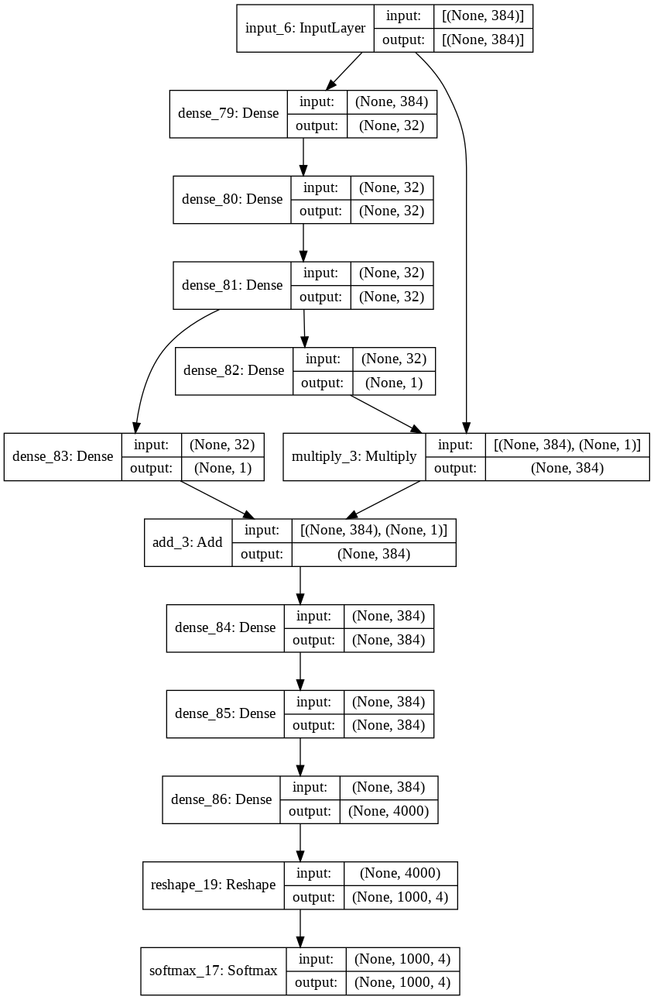

In [ ]:
ip = keras.Input(shape = (384, ))

y0 = Dense(32, activation = 'relu')(ip)
y1 = Dense(32, activation = 'relu')(y0)
y2 = Dense(32, activation = 'relu')(y1)
y3 = Dense(1)(y2)
y4 = Dense(1)(y2)

x = Multiply()([ip, y3])
x = Add()([x, y4])

x = Dense(384, use_bias = True)(x)
x = Dense(384, use_bias = True)(x)
x = Dense(4000)(x)
x = Reshape((1000,4))(x)
op = Softmax()(x)

model = keras.Model(ip, op)
model.compile(optimizer = 'adam', loss='mean_squared_error')
keras.utils.plot_model(model, show_shapes = True)

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = True, fourier = False,
          norm = True)

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

curves:  (9016, 384)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
Epoch 1/150
127/127 [==============================] - 2s 11ms/step - loss: 0.1598 - val_loss: 0.1142
Epoch 2/150
127/127 [==============================] - 1s 9ms/step - loss: 0.1135 - val_loss: 0.1056
Epoch 3/150
127/127 [==============================] - 1s 9ms/step - loss: 0.1074 - val_loss: 0.1026
Epoch 4/150
127/127 [==============================] - 1s 9ms/step - loss: 0.1040 - val_loss: 0.0999
Epoch 5/150
127/127 [==============================] - 1s 9ms/step - loss: 0.1019 - val_loss: 0.0988
Epoch 6/150
127/127 [==============================] - 1s 9ms/step - loss: 0.1000 - val_loss: 0.0985
Epoch 7/150
127/127 [==============================] - 1s 9ms/step - loss: 0.0996 - val_loss: 0.0976
Epoch 8/150
127/127 [==============================] - 1s 9ms/step - loss: 0.0982 - val_loss: 0.0967
Epoch 9/150
127/127 [==============================] - 1s 9ms/step - loss: 0.0979 - val_loss: 0.0973
Epoch 

## Plotting:

In [ ]:
for i in range(-10,0):
    sx_actual = combine(surfaces[combos[i,3]], clouds[combos[i,1]])
    # sx_actual = surfaces[combos[i,3]]
    mollweide(faces, sx_actual)
    sx_pred = model.predict(curves[i].reshape(1,-1))[0]
    # convert from one hot to ints:
    sx_pred = np.argmax(sx_pred, axis = 1).astype(int)
    mollweide(faces, sx_pred)
    plt.show()
    print()

# Surface Fractions in the Loss Function:

#### Predicting Surface Fractions:

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = True, fourier = True,
          norm = True)

fracs = np.sum(stypes, axis = 1)/1000
print('fracs:  ', fracs.shape)

curves:  (9016, 768)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
fracs:   (9016, 4)


In [ ]:
model = keras.Sequential()
# model.add(Dense(768, input_shape = (768,)))
# model.add(Dense(100))
model.add(Dense(4, input_shape = (768,)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    fracs,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_15 (Dense)             (None, 4)                 3076      
_________________________________________________________________
softmax_6 (Softmax)          (None, 4)                 0         
Total params: 3,076
Trainable params: 3,076
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
127/127 [==============================] - 1s 3ms/step - loss: 0.0473 - val_loss: 0.0165
Epoch 2/150
127/127 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0066
Epoch 3/150
127/127 [==============================] - 0s 2ms/step - loss: 0.0060 - val_loss: 0.0045
Epoch 4/150
127/127 [==============================] - 0s 2ms/step - loss: 0.0044 - val_loss: 0.0038
Epoch 5/150
127/127 [==============================] - 0s 2ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 6/1

In [ ]:
model = keras.Sequential()
# model.add(Dense(768, input_shape = (768,)))
model.add(Dense(16, input_shape = (768, )))
model.add(Dense(16))
model.add(Dense(4))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    fracs,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_30 (Dense)             (None, 16)                12304     
_________________________________________________________________
dense_31 (Dense)             (None, 16)                272       
_________________________________________________________________
dense_32 (Dense)             (None, 4)                 68        
_________________________________________________________________
softmax_13 (Softmax)         (None, 4)                 0         
Total params: 12,644
Trainable params: 12,644
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
127/127 [==============================] - 1s 5ms/step - loss: 0.0341 - val_loss: 0.0041
Epoch 2/150
127/127 [==============================] - 0s 2ms/step - loss: 0.0040 - val_loss: 0.0034
Epoch 3/150
127/127 [========================

#### Weight Losses = [1,1]

In [ ]:
ip = keras.Input(shape = (8*8*6, ))
x1 = Dense(8*8*6, input_shape = (8*8*6, ) )(ip)
x2 = Dense(8*8*6 )(x1)
x3 = Dense(4000, )(x2)
x4 = Reshape((1000, 4))(x3)
op1 = Softmax()(x4)
op2 = Lambda(lambda x: K.sum(x, axis=1)/1000)(op1)

# comiles model
model = keras.Model(ip, [op1, op2])
model.compile(optimizer = 'adam', loss='mean_squared_error',
              loss_weights = [1,1])

# show:
model.summary()

# train:
model.fit(
    curves,
    [stypes, fracs],
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=20)]
)

Model: "model_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_18 (InputLayer)        [(None, 384)]             0         
_________________________________________________________________
dense_51 (Dense)             (None, 384)               147840    
_________________________________________________________________
dense_52 (Dense)             (None, 384)               147840    
_________________________________________________________________
dense_53 (Dense)             (None, 4000)              1540000   
_________________________________________________________________
reshape_17 (Reshape)         (None, 1000, 4)           0         
_________________________________________________________________
softmax_17 (Softmax)         (None, 1000, 4)           0         
_________________________________________________________________
lambda_13 (Lambda)           (None, 4)                 0   

#### Weight Losses = [1,10]

In [ ]:
ip = keras.Input(shape = (8*8*6, ))
x1 = Dense(8*8*6, input_shape = (8*8*6, ) )(ip)
x2 = Dense(8*8*6 )(x1)
x3 = Dense(4000, )(x2)
x4 = Reshape((1000, 4))(x3)
op1 = Softmax()(x4)
op2 = Lambda(lambda x: K.sum(x, axis=1)/1000)(op1)

# comiles model
model = keras.Model(ip, [op1, op2])
model.compile(optimizer = 'adam', loss='mean_squared_error',
              loss_weights = [1,10])

# show:
model.summary()

# train:
model.fit(
    curves,
    [stypes, fracs],
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=15)]
)

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 384)]             0         
_________________________________________________________________
dense (Dense)                (None, 384)               147840    
_________________________________________________________________
dense_1 (Dense)              (None, 384)               147840    
_________________________________________________________________
dense_2 (Dense)              (None, 4000)              1540000   
_________________________________________________________________
reshape (Reshape)            (None, 1000, 4)           0         
_________________________________________________________________
softmax (Softmax)            (None, 1000, 4)           0         
_________________________________________________________________
lambda (Lambda)              (None, 4)                 0     

In [ ]:
for i in range(-10,0):
    sx_actual = combine(surfaces[combos[i,3]], clouds[combos[i,1]])
    # sx_actual = surfaces[combos[i,3]]
    mollweide(faces, sx_actual)
    sx_pred = model.predict(curves[i].reshape(1,-1))[0][0]
    # convert from one hot to ints:
    sx_pred = np.argmax(sx_pred, axis = 1).astype(int)
    mollweide(faces, sx_pred)
    plt.show()
    print()

#### More Layers:

In [ ]:
ip = keras.Input(shape = (8*8*6, ))
x1 = Dense(8*8*6, input_shape = (8*8*6, ) )(ip)
x2 = Dense(8*8*6 )(x1)
x3 = Dense(8*8*6 )(x2)
x4 = Dense(8*8*6 )(x3)
x5 = Dense(4000, )(x4)
x6 = Reshape((1000, 4))(x5)
op1 = Softmax()(x6)
op2 = Lambda(lambda x: K.sum(x, axis=1)/1000)(op1)

# comiles model
model = keras.Model(ip, [op1, op2])
model.compile(optimizer = 'adam', loss='mean_squared_error',
              loss_weights = [1,10])

# show:
model.summary()

# train:
model.fit(
    curves,
    [stypes, fracs],
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=15)]
)

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 384)]             0         
_________________________________________________________________
dense_5 (Dense)              (None, 384)               147840    
_________________________________________________________________
dense_6 (Dense)              (None, 384)               147840    
_________________________________________________________________
dense_7 (Dense)              (None, 384)               147840    
_________________________________________________________________
dense_8 (Dense)              (None, 384)               147840    
_________________________________________________________________
dense_9 (Dense)              (None, 4000)              1540000   
_________________________________________________________________
reshape_1 (Reshape)          (None, 1000, 4)           0   

#### Autoencoder:

In [ ]:
ip = keras.Input(shape = (8*8*6, ))
x1 = Dense(8*8, input_shape = (8*8*6, ) )(ip)
x2 = Dense(8*8 )(x1)
x3 = Dense(4000, )(x2)
x4 = Reshape((1000, 4))(x3)
op1 = Softmax()(x4)
op2 = Lambda(lambda x: K.sum(x, axis=1)/1000)(op1)

# comiles model
model = keras.Model(ip, [op1, op2])
model.compile(optimizer = 'adam', loss='mean_squared_error',
              loss_weights = [1,10])

# show:
model.summary()

# train:
model.fit(
    curves,
    [stypes, fracs],
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=15)]
)

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 384)]             0         
_________________________________________________________________
dense_10 (Dense)             (None, 64)                24640     
_________________________________________________________________
dense_11 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_12 (Dense)             (None, 4000)              260000    
_________________________________________________________________
reshape_2 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_2 (Softmax)          (None, 1000, 4)           0         
_________________________________________________________________
lambda_2 (Lambda)            (None, 4)                 0   

# Use Fourier Curves

#### Same Architecture - only use I

In [ ]:
# load_data(i = [0, 0.01], y = [0.9, 1], flatten = True, fourier = True,
#           norm = True, polarization = False)

# print(curves.shape)

model = keras.Sequential()
model.add(Dense(64*6, input_shape = (64*6,)))
model.add(Dense(64*6, input_shape = (64*6,)))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 384)               147840    
_________________________________________________________________
dense_7 (Dense)              (None, 384)               147840    
_________________________________________________________________
dense_8 (Dense)              (None, 4000)              1540000   
_________________________________________________________________
reshape_2 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_2 (Softmax)          (None, 1000, 4)           0         
Total params: 1,835,680
Trainable params: 1,835,680
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
127/127 [==============================] - 2s 10ms/step - loss: 0.1566 - val_loss: 0.1206
Epoch 2/

#### Use Only Q

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = False, fourier = True,
          norm = False, polarization = True)

curves = curves[:, 1::2]
curves = curves.reshape((-1, 384))

model = keras.Sequential()
model.add(Dense(384, input_shape = (384,)))
model.add(Dense(384))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

curves:  (9016, 8, 8, 6, 2)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_38 (Dense)             (None, 384)               147840    
_________________________________________________________________
dense_39 (Dense)             (None, 384)               147840    
_________________________________________________________________
dense_40 (Dense)             (None, 4000)              1540000   
_________________________________________________________________
reshape_2 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_2 (Softmax)          (None, 1000, 4)           0         
Total params: 1,835,680
Trainable params: 1,835,680
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
127/127

#### Use Only P

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = False, fourier = True,
          norm = True)

# divide Q by I to get P:
curves = curves[:,:,:,:,1] / (curves[:,:,:,:,0] + 1e-3)
# flatten:
curves = curves.reshape((9016,-1))


model = keras.Sequential()
model.add(Dense(384, input_shape = (384,)))
model.add(Dense(384))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

curves:  (9016, 8, 8, 6, 2)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_46 (Dense)             (None, 384)               147840    
_________________________________________________________________
dense_47 (Dense)             (None, 384)               147840    
_________________________________________________________________
dense_48 (Dense)             (None, 4000)              1540000   
_________________________________________________________________
reshape_15 (Reshape)         (None, 1000, 4)           0         
_________________________________________________________________
softmax_13 (Softmax)         (None, 1000, 4)           0         
Total params: 1,835,680
Trainable params: 1,835,680
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
127/12

#### Use Q and I

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = True, fourier = True,
          norm = True, polarization = True)

curves:  (9016, 768)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)


In [ ]:
model = keras.Sequential()
model.add(Dense(768, input_shape = (768,)))
model.add(Dropout(0.1))
model.add(Dense(768))
model.add(Dropout(0.1))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 768)               590592    
_________________________________________________________________
dropout (Dropout)            (None, 768)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 768)               590592    
_________________________________________________________________
dropout_1 (Dropout)          (None, 768)               0         
_________________________________________________________________
dense_11 (Dense)             (None, 4000)              3076000   
_________________________________________________________________
reshape_3 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_3 (Softmax)          (None, 1000, 4)          

#### Use P and I

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = False, fourier = True,
          norm = True)

curves:  (9016, 8, 8, 6, 2)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)


In [ ]:
# divide Q by I to get P:
curves[:,:,:,:,1] /= (curves[:,:,:,:,0] + 1e-3)
# flatten:
curves = curves.reshape((9016,-1))

In [ ]:
model = keras.Sequential()
model.add(Dense(768, input_shape = (768,)))
model.add(Dense(768))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_28 (Dense)             (None, 768)               590592    
_________________________________________________________________
dense_29 (Dense)             (None, 768)               590592    
_________________________________________________________________
dense_30 (Dense)             (None, 4000)              3076000   
_________________________________________________________________
reshape_9 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
softmax_9 (Softmax)          (None, 1000, 4)           0         
Total params: 4,257,184
Trainable params: 4,257,184
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
127/127 [==============================] - 2s 15ms/step - loss: 0.1376 - val_loss: 0.1079
Epoch 2/

#### Use P, Q and I

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = False, fourier = True,
          norm = True)

# divide Q by I to get P:
P = curves[:,:,:,:,1] / (curves[:,:,:,:,0] + 1e-3)
P = np.expand_dims(P, -1)
curves = np.append(curves, P, axis = -1)

# flatten:
curves = curves.reshape((9016,-1))

print(curves.shape)

curves:  (9016, 8, 8, 6, 2)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
(9016, 1152)


In [ ]:
model = keras.Sequential()
model.add(Dense(1152, input_shape = (1152,)))
model.add(Dense(1152))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_37 (Dense)             (None, 1152)              1328256   
_________________________________________________________________
dense_38 (Dense)             (None, 1152)              1328256   
_________________________________________________________________
dense_39 (Dense)             (None, 4000)              4612000   
_________________________________________________________________
reshape_12 (Reshape)         (None, 1000, 4)           0         
_________________________________________________________________
softmax_10 (Softmax)         (None, 1000, 4)           0         
Total params: 7,268,512
Trainable params: 7,268,512
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
127/127 [==============================] - 3s 22ms/step - loss: 0.1355 - val_loss: 0.1090
Epoch 2

#### Plots

In [ ]:
for i in range(-20,0):
    sx_actual = combine(surfaces[combos[i,3]], clouds[combos[i,1]])
    # sx_actual = surfaces[combos[i,3]]
    mollweide(faces, sx_actual)
    sx_pred = model.predict(curves[i].reshape(1,-1))[0]
    # convert from one hot to ints:
    sx_pred = np.argmax(sx_pred, axis = 1).astype(int)
    mollweide(faces, sx_pred)
    plt.show()
    print()

#### Convolutions

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = False, fourier = True,
          norm = False, polarization = True)
curves = curves.reshape((-1,8,8,12))


model = keras.Sequential()
model.add(Input(shape = (8,8,12)))
model.add( Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid') )
model.add( Conv2D(filters = 16, kernel_size = (1, 5), padding = 'valid') )
model.add( Flatten() )

model.add(Dense(256))
model.add(Dense(256))
model.add(Dense(256))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

curves:  (9016, 8, 8, 6, 2)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 8, 6, 16)          592       
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 8, 2, 16)          1296      
_________________________________________________________________
flatten_4 (Flatten)          (None, 256)               0         
_________________________________________________________________
dense_53 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_54 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_55 (Dense)             (None, 4000)              1028000   
_____________________________

#### One more layer

In [ ]:
model = keras.Sequential()
model.add(Input(shape = (8,8,12)))
model.add( Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid') )
model.add( Conv2D(filters = 16, kernel_size = (1, 5), padding = 'valid') )
model.add( Flatten() )

model.add(Dense(256))
model.add(Dense(256))
model.add(Dense(256))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 8, 6, 16)          592       
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 8, 2, 16)          1296      
_________________________________________________________________
flatten_5 (Flatten)          (None, 256)               0         
_________________________________________________________________
dense_56 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_57 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_58 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_59 (Dense)             (None, 4000)             

#### PReLU

In [ ]:
model = keras.Sequential()
model.add(Input(shape = (8,8,12)))
model.add( Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid') )
model.add( Conv2D(filters = 16, kernel_size = (1, 5), padding = 'valid') )
model.add( Flatten() )

model.add(Dense(256))
model.add(PReLU())
model.add(Dense(256))
model.add(PReLU())
model.add(Dense(256))
model.add(PReLU())
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 8, 6, 16)          592       
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 8, 2, 16)          1296      
_________________________________________________________________
flatten_9 (Flatten)          (None, 256)               0         
_________________________________________________________________
dense_63 (Dense)             (None, 256)               65792     
_________________________________________________________________
p_re_lu (PReLU)              (None, 256)               256       
_________________________________________________________________
dense_64 (Dense)             (None, 256)               65792     
_________________________________________________________________
p_re_lu_1 (PReLU)            (None, 256)             

#### No Polarization:

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = False, fourier = True,
          norm = False, polarization = False)

model = keras.Sequential()
model.add(Input(shape = (8,8,6)))
model.add( Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid') )
model.add( Conv2D(filters = 16, kernel_size = (1, 5), padding = 'valid') )
model.add( Flatten() )

model.add(Dense(256))
model.add(Dense(256))
model.add(Dense(256))
model.add(Dense(4000))
model.add(Reshape((1000,4)))
model.add(Softmax())

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

curves:  (9016, 8, 8, 6)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_24 (Conv2D)           (None, 8, 6, 16)          304       
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 8, 2, 16)          1296      
_________________________________________________________________
flatten_11 (Flatten)         (None, 256)               0         
_________________________________________________________________
dense_71 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_72 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_73 (Dense)             (None, 256)               65792     
_______________________________

## Only Oceans

#### Using I

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = False, fourier = True,
          norm = False, polarization = False)

model = keras.Sequential()
model.add(Input(shape = (8,8,6)))
model.add( Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid') )
model.add( Conv2D(filters = 16, kernel_size = (1, 5), padding = 'valid') )
model.add( Flatten() )

model.add(Dense(256))
model.add(Dense(256))
model.add(Dense(256))
model.add(Dense(1000, activation = 'sigmoid'))

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes[:,:,0],
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

curves:  (9016, 8, 8, 6)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 8, 6, 16)          304       
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 8, 2, 16)          1296      
_________________________________________________________________
flatten_5 (Flatten)          (None, 256)               0         
_________________________________________________________________
dense_20 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_21 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_22 (Dense)             (None, 256)               65792     
________________________________

#### Using Q

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = False, fourier = True,
          norm = False, polarization = True)

curves = curves[:,:,:,:,1]

model = keras.Sequential()
model.add(Input(shape = (8,8,6)))
model.add( Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid') )
model.add( Conv2D(filters = 16, kernel_size = (1, 5), padding = 'valid') )
model.add( Flatten() )

model.add(Dense(256))
model.add(Dense(256))
model.add(Dense(256))
model.add(Dense(1000, activation = 'sigmoid'))

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes[:,:,0],
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

curves:  (9016, 8, 8, 6, 2)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 8, 6, 16)          304       
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 8, 2, 16)          1296      
_________________________________________________________________
flatten_6 (Flatten)          (None, 256)               0         
_________________________________________________________________
dense_24 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_25 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_26 (Dense)             (None, 256)               65792     
_____________________________

#### Q and I

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = False, fourier = True,
          norm = False, polarization = True)

curves = curves.reshape(-1,8,8,12)

model = keras.Sequential()
model.add(Input(shape = (8,8,12)))
model.add( Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid') )
model.add( Conv2D(filters = 16, kernel_size = (1, 5), padding = 'valid') )
model.add( Flatten() )

model.add(Dense(256))
model.add(Dense(256))
model.add(Dense(256))
model.add(Dense(1000, activation = 'sigmoid'))

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

model.fit(
    curves,
    stypes[:,:,0],
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

curves:  (9016, 8, 8, 6, 2)
combos:  (9016, 4)
axes:    (9016, 3)
stypes:  (9016, 1000, 4)
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_14 (Conv2D)           (None, 8, 6, 16)          592       
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 8, 2, 16)          1296      
_________________________________________________________________
flatten_7 (Flatten)          (None, 256)               0         
_________________________________________________________________
dense_28 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_29 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_30 (Dense)             (None, 256)               65792     
_____________________________

In [ ]:
# ahhh = np.random.randint(0, 1000, size = (1000, 12))
idxs = np.random.randint(0, 1000, size = (13*1000))

model = keras.Sequential()

model = keras.Sequential()
model.add(Input(shape = (8,8,12)))
model.add( Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid') )
model.add( Conv2D(filters = 16, kernel_size = (1, 5), padding = 'valid') )
model.add( Flatten() )

model.add(Dense(4000))
model.add(Reshape((1000,4)))

model.add(Lambda(lambda x: tf.gather(x, idxs, axis = 1)))
# model.add(Reshape((13000,1)))
model.add( Conv1D(filters = 4, kernel_size = 13, strides = 13))

model.add(Lambda(lambda x: tf.gather(x, idxs, axis = 1)))
model.add( Conv1D(filters = 4, kernel_size = 13, strides = 13))

model.compile(optimizer = 'adam', loss='mean_squared_error')
model.summary()

Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_24 (Conv2D)           (None, 8, 6, 16)          592       
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 8, 2, 16)          1296      
_________________________________________________________________
flatten_12 (Flatten)         (None, 256)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 4000)              1028000   
_________________________________________________________________
reshape_7 (Reshape)          (None, 1000, 4)           0         
_________________________________________________________________
lambda_15 (Lambda)           (None, 13000, 4)          0         
_________________________________________________________________
conv1d_5 (Conv1D)            (None, 1000, 4)         

# Spherical Convolutions

#### Upsampling:

In [ ]:
# idx_250 = np.load('upscale_250_1000.npy')

# def upscale(x):
#     x = Lambda(lambda x: tf.gather(x, idx_250, axis = 1))(x)
#     return x

In [ ]:
# inputs = keras.Input(shape=(8, 8, 12))
# x = conv_curves(inputs, kernel_size = 3, filters = 16)
# x = conv_curves(x, kernel_size = 3, filters = 4)

# x = Flatten()(x)
# x = Dense(1000)(x)
# x = Reshape((250,4))(x)
# output_block_1 = upscale(x)

# x = sphere_conv(output_block_1, rings = 1, filters = 4)
# output_block_2 = add([x, output_block_1])

# x = sphere_conv(output_block_2, rings = 1, filters = 4)
# output_block_3 = add([x, output_block_2])

# model = keras.Model(inputs, output_block_3)
# model.compile(optimizer = 'adam', loss='mean_squared_error')

# model.summary()
# keras.utils.plot_model(model, show_shapes=True)

NameError: ignored

In [ ]:
# model.fit(
#     curves,
#     stypes,
#     epochs=150,
#     batch_size=64,
#     validation_split=0.1,
#     callbacks=[keras.callbacks.EarlyStopping(patience=10)]
# )

# print_confusion(model, curves, stypes)

Epoch 1/150
127/127 [==============================] - 4s 21ms/step - loss: 0.1828 - val_loss: 0.1268
Epoch 2/150
127/127 [==============================] - 2s 19ms/step - loss: 0.1249 - val_loss: 0.1040
Epoch 3/150
127/127 [==============================] - 2s 19ms/step - loss: 0.1044 - val_loss: 0.0989
Epoch 4/150
127/127 [==============================] - 2s 19ms/step - loss: 0.0996 - val_loss: 0.0963
Epoch 5/150
127/127 [==============================] - 2s 19ms/step - loss: 0.0972 - val_loss: 0.0948
Epoch 6/150
127/127 [==============================] - 2s 19ms/step - loss: 0.0957 - val_loss: 0.0933
Epoch 7/150
127/127 [==============================] - 2s 19ms/step - loss: 0.0945 - val_loss: 0.0925
Epoch 8/150
127/127 [==============================] - 2s 19ms/step - loss: 0.0944 - val_loss: 0.0916
Epoch 9/150
127/127 [==============================] - 2s 19ms/step - loss: 0.0925 - val_loss: 0.0913
Epoch 10/150
127/127 [==============================] - 2s 19ms/step - loss: 0.092

#### 2 times 1 ring

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
lambda_14 (Lambda)              (None, 8, 10, 12)    0           input_5[0][0]                    
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 8, 8, 16)     592         lambda_14[0][0]                  
__________________________________________________________________________________________________
lambda_15 (Lambda)              (None, 8, 10, 16)    0           conv2d_8[0][0]                   
____________________________________________________________________________________________

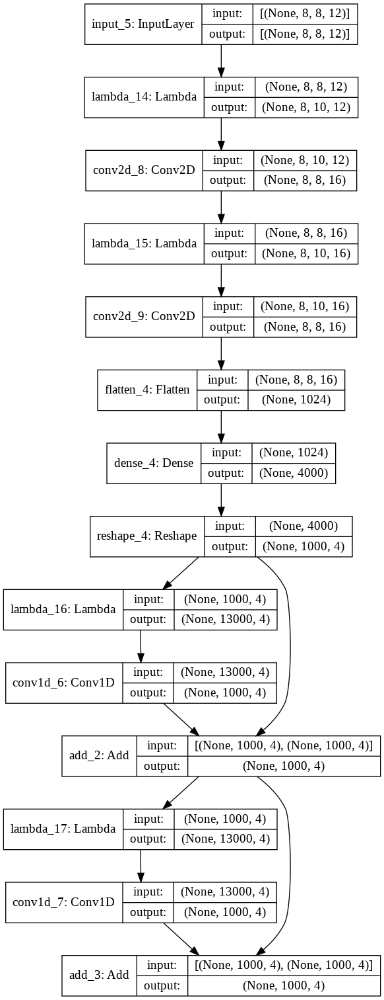

In [ ]:
# inputs = keras.Input(shape=(8, 8, 12))
# x = conv_curves(inputs, kernel_size = 3, filters = 16)
# x = conv_curves(x, kernel_size = 3, filters = 16)

# x = Flatten()(x)
# x = Dense(4000)(x)
# output_block_1 = Reshape((1000,4))(x)

# x = sphere_conv(output_block_1, rings = 1, filters = 4)
# output_block_2 = add([x, output_block_1])

# x = sphere_conv(output_block_2, rings = 1, filters = 4)
# output_block_3 = add([x, output_block_2])

# model = keras.Model(inputs, output_block_3)
# model.compile(optimizer = 'adam', loss='mean_squared_error')

# model.summary()
# keras.utils.plot_model(model, show_shapes=True)

In [ ]:
# model.fit(
#     curves,
#     stypes,
#     epochs=200,
#     batch_size=64,
#     validation_split=0.1,
#     callbacks=[keras.callbacks.EarlyStopping(patience=10)]
# )

# print_confusion(model, curves, stypes)

Epoch 1/200
64/64 [==============================] - 34s 29ms/step - loss: 0.2001 - val_loss: 0.1282
Epoch 2/200
64/64 [==============================] - 2s 24ms/step - loss: 0.1260 - val_loss: 0.1171
Epoch 3/200
64/64 [==============================] - 2s 24ms/step - loss: 0.1169 - val_loss: 0.1008
Epoch 4/200
64/64 [==============================] - 2s 24ms/step - loss: 0.0992 - val_loss: 0.0930
Epoch 5/200
64/64 [==============================] - 2s 24ms/step - loss: 0.0936 - val_loss: 0.0896
Epoch 6/200
64/64 [==============================] - 2s 24ms/step - loss: 0.0900 - val_loss: 0.0871
Epoch 7/200
64/64 [==============================] - 2s 24ms/step - loss: 0.0877 - val_loss: 0.0856
Epoch 8/200
64/64 [==============================] - 2s 24ms/step - loss: 0.0861 - val_loss: 0.0845
Epoch 9/200
64/64 [==============================] - 2s 25ms/step - loss: 0.0847 - val_loss: 0.0830
Epoch 10/200
64/64 [==============================] - 2s 24ms/step - loss: 0.0827 - val_loss: 0.081

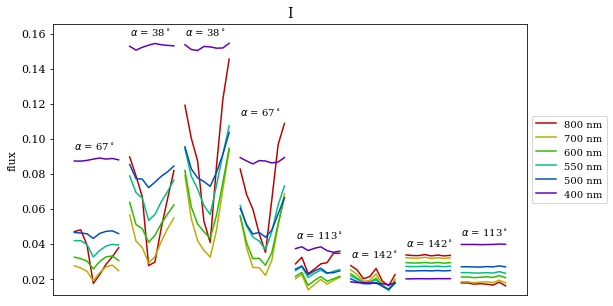

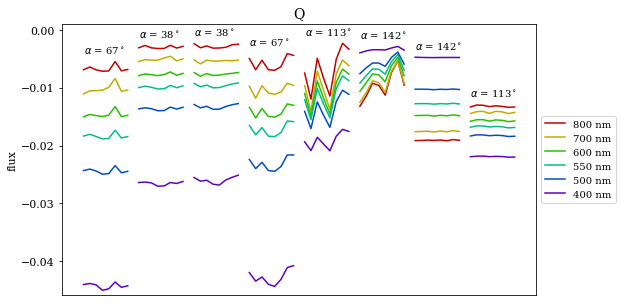

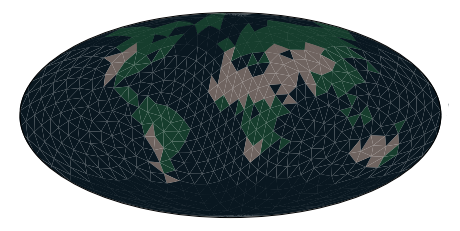

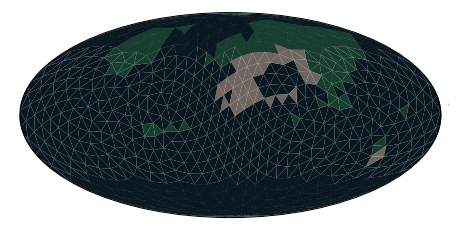

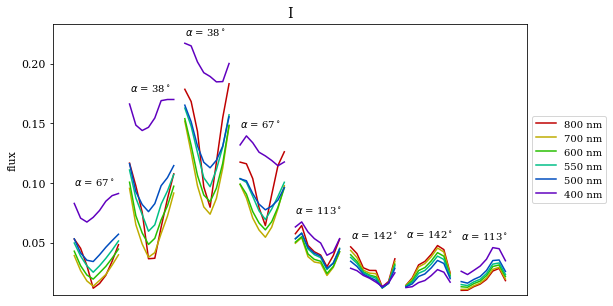

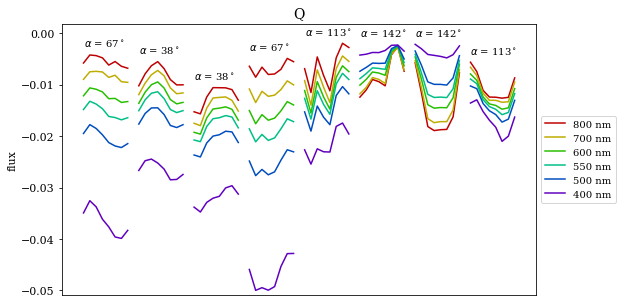

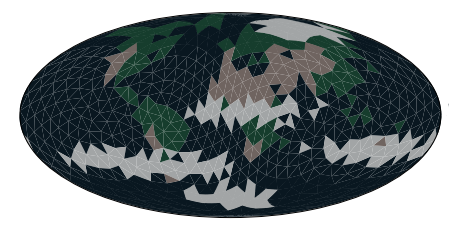

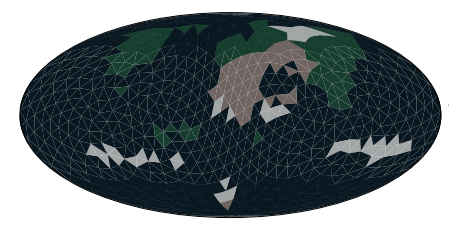

In [ ]:
# # # CREATE CURVES
# c = earth_curves(rot_axis = [0,1,0], incl = 0)
# c2 = earth_curves(rot_axis = [0,1,0], incl = 0, clouds_ind = 21)

# cx = c[:,:,:,:2]
# cx = cx.reshape((1,8,8,12))

# cx2 = c2[:,:,:,:2]
# cx2 = cx2.reshape((1,8,8,12))

# # # MAKE THE MAPS
# sx_true = np.load('data/earth_surface_types.npy')
# sx_true2 = np.maximum(sx_true, clouds[21] * 3)

# sx_pred = model.predict(cx)[0]
# sx_pred = np.argmax(sx_pred, axis = 1).astype(int)
# sx_pred2 = model.predict(cx2)[0]
# sx_pred2 = np.argmax(sx_pred2, axis = 1).astype(int)

# # PLOT
# plot_fluxes(c[:,:,:,0], 0)
# plt.title('I')
# plot_fluxes(c[:,:,:,1], 0)
# plt.title('Q')
# mollweide(faces, sx_true)
# mollweide(faces, sx_pred)

# plt.show()
# print()
# print()

# plot_fluxes(c2[:,:,:,0], 0)
# plt.title('I')
# plot_fluxes(c2[:,:,:,1], 0)
# plt.title('Q')
# mollweide(faces, sx_true2)
# mollweide(faces, sx_pred2)

#### No Polarization

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 8, 8, 6)]    0                                            
__________________________________________________________________________________________________
lambda_4 (Lambda)               (None, 8, 10, 6)     0           input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 8, 8, 16)     304         lambda_4[0][0]                   
__________________________________________________________________________________________________
lambda_5 (Lambda)               (None, 8, 10, 16)    0           conv2d_2[0][0]                   
____________________________________________________________________________________________

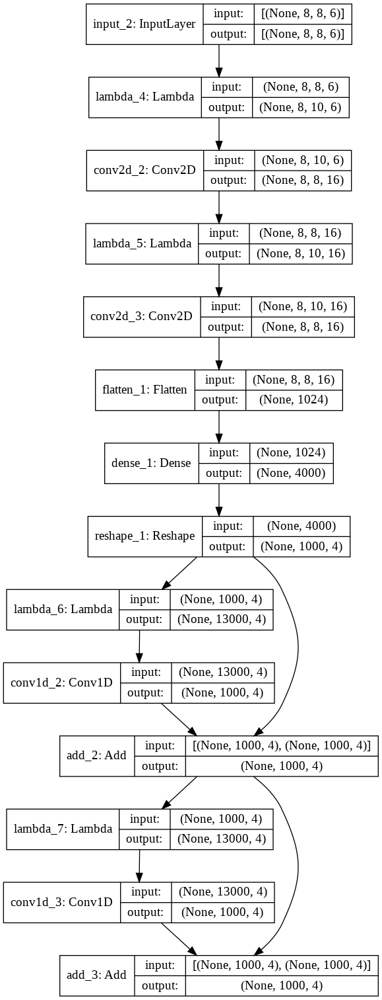

In [ ]:
inputs = keras.Input(shape=(8, 8, 6))
x = conv_curves(inputs, kernel_size = 3, filters = 16)
x = conv_curves(x, kernel_size = 3, filters = 16)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves[:,:,:,::2],
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves[:,:,:,::2], stypes)

Epoch 1/250
64/64 [==============================] - 3s 28ms/step - loss: 0.2274 - val_loss: 0.1409
Epoch 2/250
64/64 [==============================] - 2s 24ms/step - loss: 0.1318 - val_loss: 0.1060
Epoch 3/250
64/64 [==============================] - 2s 24ms/step - loss: 0.1065 - val_loss: 0.0993
Epoch 4/250
64/64 [==============================] - 2s 24ms/step - loss: 0.1002 - val_loss: 0.0949
Epoch 5/250
64/64 [==============================] - 2s 24ms/step - loss: 0.0961 - val_loss: 0.0916
Epoch 6/250
64/64 [==============================] - 2s 24ms/step - loss: 0.0921 - val_loss: 0.0900
Epoch 7/250
64/64 [==============================] - 2s 25ms/step - loss: 0.0904 - val_loss: 0.0881
Epoch 8/250
64/64 [==============================] - 2s 24ms/step - loss: 0.0889 - val_loss: 0.0868
Epoch 9/250
64/64 [==============================] - 2s 25ms/step - loss: 0.0878 - val_loss: 0.0855
Epoch 10/250
64/64 [==============================] - 2s 24ms/step - loss: 0.0858 - val_loss: 0.0845

#### Lambertian

In [ ]:
load_data(i = [0, 0.01], y = [0.98, 1], flatten = False, fourier = False,
          norm = True, polarization = True)

curves:  (4535, 8, 8, 6)
combos:  (4535, 4)
axes:    (4535, 3)
stypes:  (4535, 1000, 4)


In [ ]:
model.fit(
    curves,
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/250
64/64 [==============================] - 2s 27ms/step - loss: 0.1272 - val_loss: 0.0939
Epoch 2/250
64/64 [==============================] - 2s 24ms/step - loss: 0.0921 - val_loss: 0.0893
Epoch 3/250
64/64 [==============================] - 2s 24ms/step - loss: 0.0885 - val_loss: 0.0866
Epoch 4/250
64/64 [==============================] - 2s 25ms/step - loss: 0.0866 - val_loss: 0.0853
Epoch 5/250
64/64 [==============================] - 2s 24ms/step - loss: 0.0853 - val_loss: 0.0844
Epoch 6/250
64/64 [==============================] - 2s 24ms/step - loss: 0.0839 - val_loss: 0.0831
Epoch 7/250
64/64 [==============================] - 2s 24ms/step - loss: 0.0831 - val_loss: 0.0829
Epoch 8/250
64/64 [==============================] - 2s 24ms/step - loss: 0.0824 - val_loss: 0.0816
Epoch 9/250
64/64 [==============================] - 2s 25ms/step - loss: 0.0816 - val_loss: 0.0811
Epoch 10/250
64/64 [==============================] - 2s 25ms/step - loss: 0.0810 - val_loss: 0.0805

#### All different types:

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
conv2d_22 (Conv2D)              (None, 8, 6, 16)     592         input_12[0][0]                   
__________________________________________________________________________________________________
conv2d_23 (Conv2D)              (None, 8, 4, 16)     784         conv2d_22[0][0]                  
__________________________________________________________________________________________________
flatten_11 (Flatten)            (None, 512)          0           conv2d_23[0][0]                  
____________________________________________________________________________________________

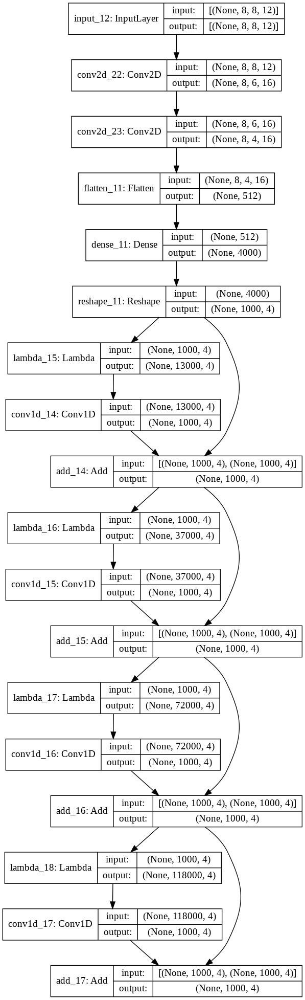

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(inputs)
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(x)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv_1(output_block_1)
output_block_2 = add([x, output_block_1])

x = sphere_conv_2(output_block_2)
output_block_3 = add([x, output_block_2])

x = sphere_conv_3(output_block_3)
output_block_4 = add([x, output_block_3])

x = sphere_conv_4(output_block_4)
output_block_5 = add([x, output_block_4])

x = sphere_conv_5(output_block_5)
output_block_6 = add([x, output_block_5])

model = keras.Model(inputs, output_block_5)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/150
127/127 [==============================] - 38s 282ms/step - loss: 0.1636 - val_loss: 0.1027
Epoch 2/150
127/127 [==============================] - 35s 274ms/step - loss: 0.1031 - val_loss: 0.0984
Epoch 3/150
127/127 [==============================] - 35s 272ms/step - loss: 0.0990 - val_loss: 0.0952
Epoch 4/150
127/127 [==============================] - 35s 273ms/step - loss: 0.0967 - val_loss: 0.0939
Epoch 5/150
127/127 [==============================] - 35s 272ms/step - loss: 0.0947 - val_loss: 0.0925
Epoch 6/150
127/127 [==============================] - 35s 273ms/step - loss: 0.0933 - val_loss: 0.0917
Epoch 7/150
127/127 [==============================] - 35s 273ms/step - loss: 0.0933 - val_loss: 0.0910
Epoch 8/150
127/127 [==============================] - 35s 273ms/step - loss: 0.0921 - val_loss: 0.0905
Epoch 9/150
127/127 [==============================] - 35s 273ms/step - loss: 0.0912 - val_loss: 0.0897
Epoch 10/150
127/127 [==============================] - 35s 273m

KeyboardInterrupt: ignored

#### Combinations:

Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
conv2d_24 (Conv2D)              (None, 8, 6, 16)     592         input_13[0][0]                   
__________________________________________________________________________________________________
conv2d_25 (Conv2D)              (None, 8, 4, 16)     784         conv2d_24[0][0]                  
__________________________________________________________________________________________________
flatten_12 (Flatten)            (None, 512)          0           conv2d_25[0][0]                  
____________________________________________________________________________________________

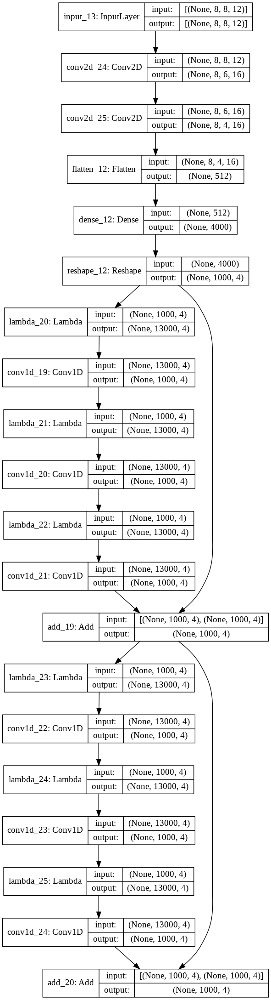

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(inputs)
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(x)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv_1(output_block_1)
x = sphere_conv_1(x)
x = sphere_conv_1(x)
output_block_2 = add([x, output_block_1])

x = sphere_conv_1(output_block_2)
x = sphere_conv_1(x)
x = sphere_conv_1(x)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/150
127/127 [==============================] - 7s 43ms/step - loss: 0.1730 - val_loss: 0.1058
Epoch 2/150
127/127 [==============================] - 5s 40ms/step - loss: 0.1047 - val_loss: 0.0974
Epoch 3/150
127/127 [==============================] - 5s 40ms/step - loss: 0.0982 - val_loss: 0.0945
Epoch 4/150
127/127 [==============================] - 5s 40ms/step - loss: 0.0955 - val_loss: 0.0929
Epoch 5/150
127/127 [==============================] - 5s 40ms/step - loss: 0.0937 - val_loss: 0.0917
Epoch 6/150
127/127 [==============================] - 5s 40ms/step - loss: 0.0930 - val_loss: 0.0909
Epoch 7/150
127/127 [==============================] - 5s 41ms/step - loss: 0.0913 - val_loss: 0.0904
Epoch 8/150
127/127 [==============================] - 5s 41ms/step - loss: 0.0902 - val_loss: 0.0894
Epoch 9/150
127/127 [==============================] - 5s 41ms/step - loss: 0.0896 - val_loss: 0.0895
Epoch 10/150
127/127 [==============================] - 5s 41ms/step - loss: 0.089

KeyboardInterrupt: ignored

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_14 (InputLayer)           [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
conv2d_26 (Conv2D)              (None, 8, 6, 16)     592         input_14[0][0]                   
__________________________________________________________________________________________________
conv2d_27 (Conv2D)              (None, 8, 4, 16)     784         conv2d_26[0][0]                  
__________________________________________________________________________________________________
flatten_13 (Flatten)            (None, 512)          0           conv2d_27[0][0]                  
____________________________________________________________________________________________

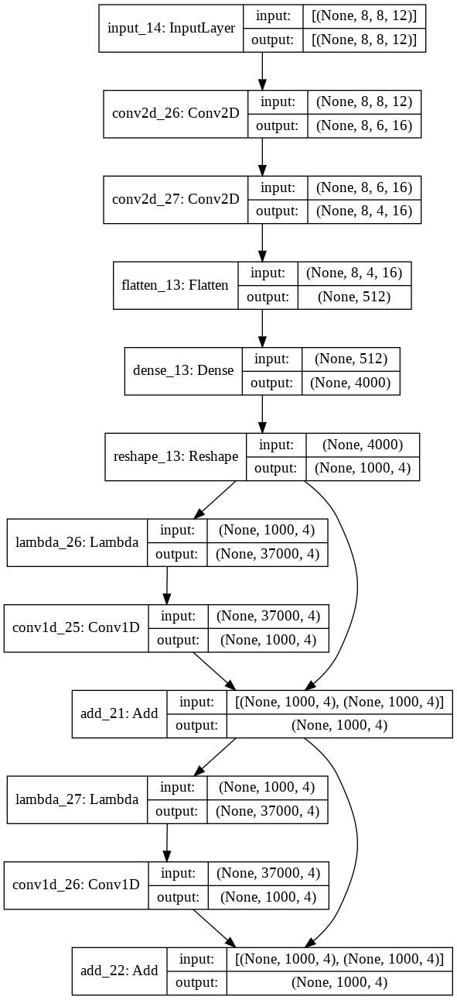

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(inputs)
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(x)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv_2(output_block_1)
output_block_2 = add([x, output_block_1])

x = sphere_conv_2(output_block_2)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/150
127/127 [==============================] - 8s 55ms/step - loss: 0.1783 - val_loss: 0.1084
Epoch 2/150
127/127 [==============================] - 7s 54ms/step - loss: 0.1064 - val_loss: 0.0987
Epoch 3/150
127/127 [==============================] - 7s 54ms/step - loss: 0.0987 - val_loss: 0.0951
Epoch 4/150
127/127 [==============================] - 7s 55ms/step - loss: 0.0952 - val_loss: 0.0928
Epoch 5/150
127/127 [==============================] - 7s 55ms/step - loss: 0.0936 - val_loss: 0.0917
Epoch 6/150
127/127 [==============================] - 7s 55ms/step - loss: 0.0927 - val_loss: 0.0906
Epoch 7/150
127/127 [==============================] - 7s 55ms/step - loss: 0.0917 - val_loss: 0.0900
Epoch 8/150
127/127 [==============================] - 7s 55ms/step - loss: 0.0908 - val_loss: 0.0897
Epoch 9/150
127/127 [==============================] - 7s 55ms/step - loss: 0.0907 - val_loss: 0.0891
Epoch 10/150
127/127 [==============================] - 7s 55ms/step - loss: 0.089

#### Add Softmaxes:

Model: "model_10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_18 (InputLayer)           [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
conv2d_34 (Conv2D)              (None, 8, 6, 16)     592         input_18[0][0]                   
__________________________________________________________________________________________________
conv2d_35 (Conv2D)              (None, 8, 4, 16)     784         conv2d_34[0][0]                  
__________________________________________________________________________________________________
flatten_17 (Flatten)            (None, 512)          0           conv2d_35[0][0]                  
___________________________________________________________________________________________

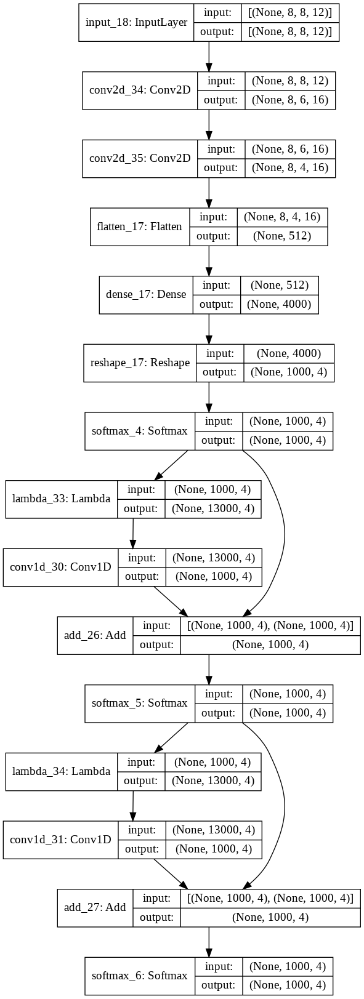

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(inputs)
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(x)

x = Flatten()(x)
x = Dense(4000)(x)
x = Reshape((1000,4))(x)
output_block_1 = Softmax()(x)

x = sphere_conv_1(output_block_1)
x = add([x, output_block_1])
output_block_2 = Softmax()(x)

x = sphere_conv_1(output_block_2)
x = add([x, output_block_2])
output_block_3 = Softmax()(x)

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/150
127/127 [==============================] - 3s 23ms/step - loss: 0.1812 - val_loss: 0.1515
Epoch 2/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1424 - val_loss: 0.1169
Epoch 3/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1153 - val_loss: 0.1062
Epoch 4/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1070 - val_loss: 0.1014
Epoch 5/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1022 - val_loss: 0.0985
Epoch 6/150
127/127 [==============================] - 3s 21ms/step - loss: 0.0990 - val_loss: 0.0966
Epoch 7/150
127/127 [==============================] - 3s 21ms/step - loss: 0.0962 - val_loss: 0.0950
Epoch 8/150
127/127 [==============================] - 3s 21ms/step - loss: 0.0942 - val_loss: 0.0940
Epoch 9/150
127/127 [==============================] - 3s 21ms/step - loss: 0.0939 - val_loss: 0.0930
Epoch 10/150
127/127 [==============================] - 3s 21ms/step - loss: 0.092

Model: "model_13"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_21 (InputLayer)           [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
conv2d_40 (Conv2D)              (None, 8, 6, 16)     592         input_21[0][0]                   
__________________________________________________________________________________________________
conv2d_41 (Conv2D)              (None, 8, 4, 16)     784         conv2d_40[0][0]                  
__________________________________________________________________________________________________
flatten_20 (Flatten)            (None, 512)          0           conv2d_41[0][0]                  
___________________________________________________________________________________________

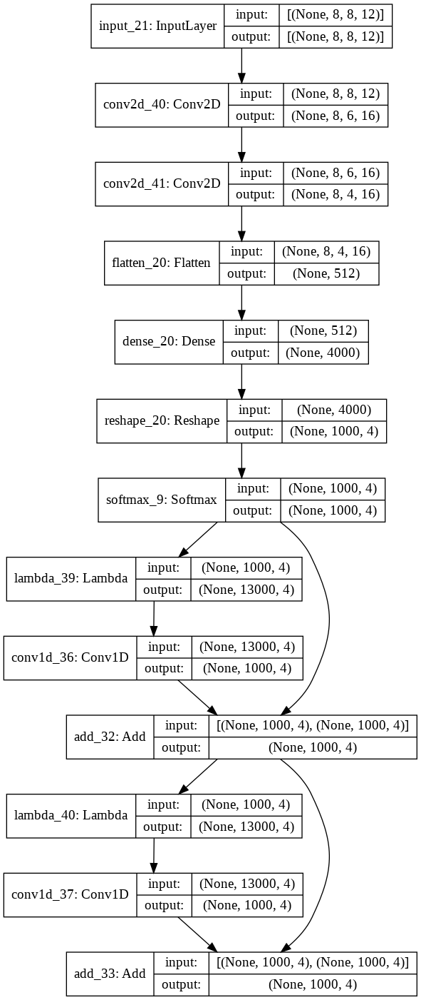

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(inputs)
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(x)

x = Flatten()(x)
x = Dense(4000)(x)
x = Reshape((1000,4))(x)
output_block_1 = Softmax()(x)

x = sphere_conv_1(output_block_1)
output_block_2 = add([x, output_block_1])

x = sphere_conv_1(output_block_2)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/150
127/127 [==============================] - 3s 22ms/step - loss: 0.1649 - val_loss: 0.1265
Epoch 2/150
127/127 [==============================] - 2s 19ms/step - loss: 0.1183 - val_loss: 0.1037
Epoch 3/150
127/127 [==============================] - 2s 19ms/step - loss: 0.1045 - val_loss: 0.0990
Epoch 4/150
127/127 [==============================] - 3s 20ms/step - loss: 0.0992 - val_loss: 0.0960
Epoch 5/150
127/127 [==============================] - 3s 20ms/step - loss: 0.0967 - val_loss: 0.0940
Epoch 6/150
127/127 [==============================] - 2s 19ms/step - loss: 0.0949 - val_loss: 0.0929
Epoch 7/150
127/127 [==============================] - 2s 19ms/step - loss: 0.0936 - val_loss: 0.0920
Epoch 8/150
127/127 [==============================] - 2s 20ms/step - loss: 0.0924 - val_loss: 0.0911
Epoch 9/150
127/127 [==============================] - 2s 20ms/step - loss: 0.0916 - val_loss: 0.0905
Epoch 10/150
127/127 [==============================] - 3s 20ms/step - loss: 0.091

Model: "model_14"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
conv2d_42 (Conv2D)              (None, 8, 6, 16)     592         input_22[0][0]                   
__________________________________________________________________________________________________
conv2d_43 (Conv2D)              (None, 8, 4, 16)     784         conv2d_42[0][0]                  
__________________________________________________________________________________________________
flatten_21 (Flatten)            (None, 512)          0           conv2d_43[0][0]                  
___________________________________________________________________________________________

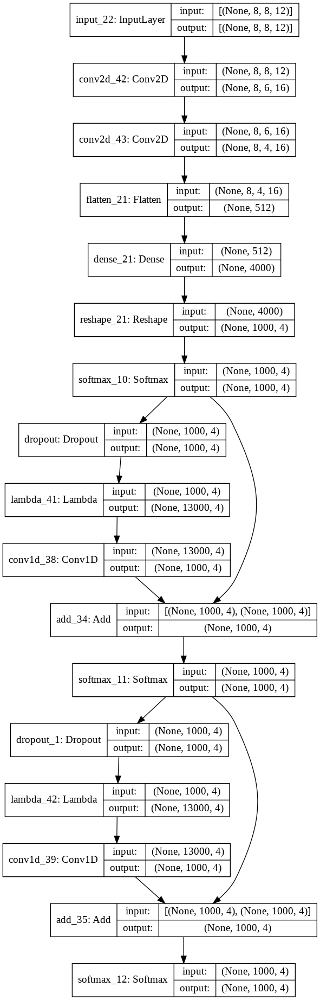

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(inputs)
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(x)

x = Flatten()(x)
x = Dense(4000)(x)
x = Reshape((1000,4))(x)
output_block_1 = Softmax()(x)

x = Dropout(0.4)(output_block_1)
x = sphere_conv_1(x)
x = add([x, output_block_1])
output_block_2 = Softmax()(x)

x = Dropout(0.4)(output_block_2)
x = sphere_conv_1(x)
x = add([x, output_block_2])
output_block_3 = Softmax()(x)

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/150
127/127 [==============================] - 4s 23ms/step - loss: 0.1853 - val_loss: 0.1370
Epoch 2/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1351 - val_loss: 0.1128
Epoch 3/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1176 - val_loss: 0.1062
Epoch 4/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1123 - val_loss: 0.1026
Epoch 5/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1080 - val_loss: 0.1003
Epoch 6/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1064 - val_loss: 0.0989
Epoch 7/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1046 - val_loss: 0.0980
Epoch 8/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1035 - val_loss: 0.0969
Epoch 9/150
127/127 [==============================] - 3s 22ms/step - loss: 0.1026 - val_loss: 0.0963
Epoch 10/150
127/127 [==============================] - 3s 21ms/step - loss: 0.101

Model: "model_17"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_25 (InputLayer)           [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
lambda_42 (Lambda)              (None, 8, 10, 12)    0           input_25[0][0]                   
__________________________________________________________________________________________________
conv2d_37 (Conv2D)              (None, 8, 8, 16)     592         lambda_42[0][0]                  
__________________________________________________________________________________________________
lambda_43 (Lambda)              (None, 8, 10, 16)    0           conv2d_37[0][0]                  
___________________________________________________________________________________________

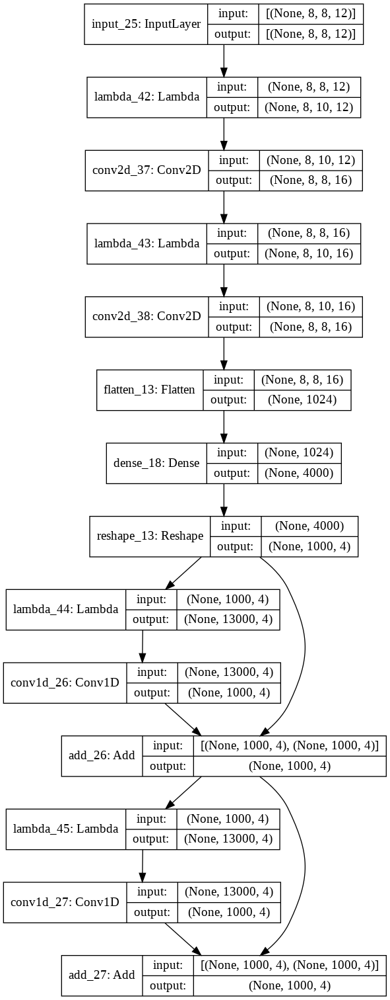

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = conv_curves(inputs, kernel_size = 3, filters = 16)
x = conv_curves(x, kernel_size = 3, filters = 16)


x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

op = Softmax()(output_block_3)

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/150
127/127 [==============================] - 3s 25ms/step - loss: 0.1017 - val_loss: 0.0975
Epoch 2/150
127/127 [==============================] - 3s 24ms/step - loss: 0.0973 - val_loss: 0.0945
Epoch 3/150
127/127 [==============================] - 3s 24ms/step - loss: 0.0948 - val_loss: 0.0929
Epoch 4/150
127/127 [==============================] - 3s 24ms/step - loss: 0.0932 - val_loss: 0.0916
Epoch 5/150
127/127 [==============================] - 3s 25ms/step - loss: 0.0921 - val_loss: 0.0906
Epoch 6/150
127/127 [==============================] - 3s 24ms/step - loss: 0.0911 - val_loss: 0.0899
Epoch 7/150
127/127 [==============================] - 3s 25ms/step - loss: 0.0904 - val_loss: 0.0893
Epoch 8/150
127/127 [==============================] - 3s 25ms/step - loss: 0.0897 - val_loss: 0.0888
Epoch 9/150
127/127 [==============================] - 3s 25ms/step - loss: 0.0892 - val_loss: 0.0883
Epoch 10/150
127/127 [==============================] - 3s 25ms/step - loss: 0.088

#### Just One Softmax at End

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
lambda_4 (Lambda)               (None, 8, 10, 12)    0           input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 8, 8, 16)     592         lambda_4[0][0]                   
__________________________________________________________________________________________________
lambda_5 (Lambda)               (None, 8, 10, 16)    0           conv2d_2[0][0]                   
____________________________________________________________________________________________

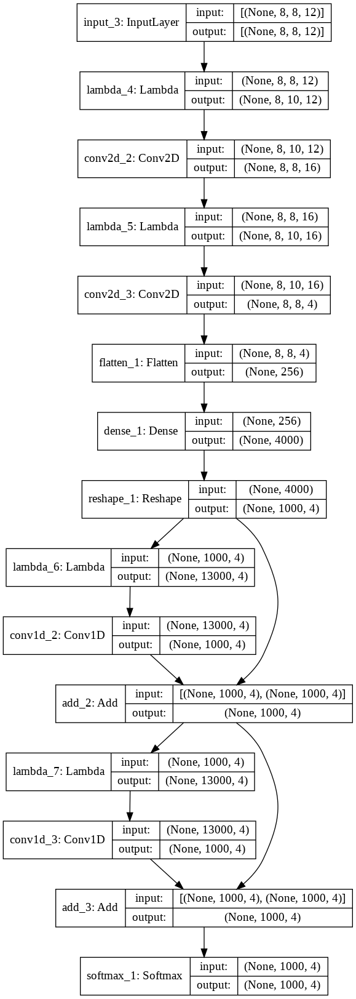

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = conv_curves(inputs, kernel_size = 3, filters = 16)
x = conv_curves(x, kernel_size = 3, filters = 4)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

op = Softmax()(output_block_3)

model = keras.Model(inputs, op)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = False, fourier = True,
          norm = True, polarization = True)

curves = curves.reshape((-1,8,8,12))

In [ ]:
model.fit(
    curves,
    stypes,
    epochs = 150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/150
127/127 [==============================] - 33s 24ms/step - loss: 0.1522 - val_loss: 0.1077
Epoch 2/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1071 - val_loss: 0.1002
Epoch 3/150
127/127 [==============================] - 3s 21ms/step - loss: 0.1002 - val_loss: 0.0959
Epoch 4/150
127/127 [==============================] - 3s 21ms/step - loss: 0.0962 - val_loss: 0.0937
Epoch 5/150
127/127 [==============================] - 3s 21ms/step - loss: 0.0944 - val_loss: 0.0924
Epoch 6/150
127/127 [==============================] - 3s 21ms/step - loss: 0.0924 - val_loss: 0.0915
Epoch 7/150
127/127 [==============================] - 3s 21ms/step - loss: 0.0917 - val_loss: 0.0906
Epoch 8/150
127/127 [==============================] - 3s 21ms/step - loss: 0.0905 - val_loss: 0.0900
Epoch 9/150
127/127 [==============================] - 3s 21ms/step - loss: 0.0902 - val_loss: 0.0895
Epoch 10/150
127/127 [==============================] - 3s 21ms/step - loss: 0.08

#### Combinations after Convolutions

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 8, 6, 16)     592         input_5[0][0]                    
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 8, 4, 16)     784         conv2d_8[0][0]                   
__________________________________________________________________________________________________
flatten_4 (Flatten)             (None, 512)          0           conv2d_9[0][0]                   
____________________________________________________________________________________________

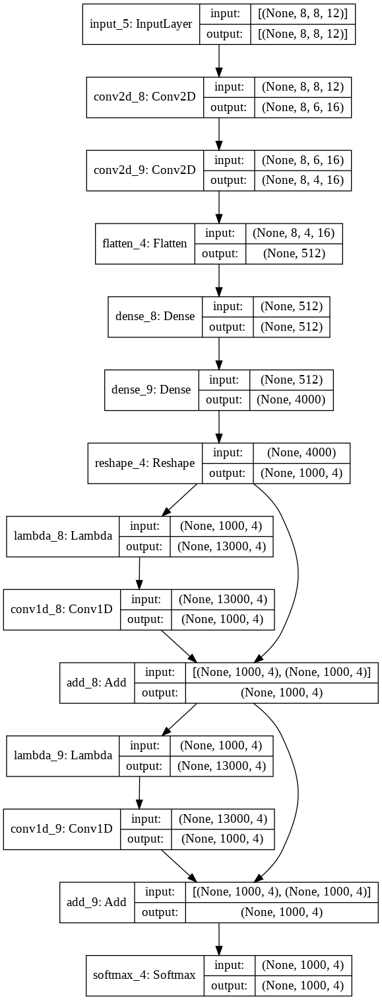

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(inputs)
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(x)

x = Flatten()(x)
x = Dense(512)(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv_1(output_block_1)
output_block_2 = add([x, output_block_1])

x = sphere_conv_1(output_block_2)
output_block_3 = add([x, output_block_2])

op = Softmax()(output_block_3)

model = keras.Model(inputs, op)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs= 150,
    batch_size = 64,
    validation_split = 0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience = 10)]
)

print_confusion(model, curves, stypes)

Epoch 1/150
127/127 [==============================] - 3s 22ms/step - loss: 0.1407 - val_loss: 0.1056
Epoch 2/150
127/127 [==============================] - 3s 20ms/step - loss: 0.1054 - val_loss: 0.0983
Epoch 3/150
127/127 [==============================] - 3s 20ms/step - loss: 0.0993 - val_loss: 0.0950
Epoch 4/150
127/127 [==============================] - 3s 20ms/step - loss: 0.0961 - val_loss: 0.0931
Epoch 5/150
127/127 [==============================] - 3s 20ms/step - loss: 0.0941 - val_loss: 0.0920
Epoch 6/150
127/127 [==============================] - 3s 20ms/step - loss: 0.0923 - val_loss: 0.0907
Epoch 7/150
127/127 [==============================] - 3s 20ms/step - loss: 0.0912 - val_loss: 0.0899
Epoch 8/150
127/127 [==============================] - 3s 20ms/step - loss: 0.0896 - val_loss: 0.0891
Epoch 9/150
127/127 [==============================] - 3s 21ms/step - loss: 0.0890 - val_loss: 0.0885
Epoch 10/150
127/127 [==============================] - 3s 21ms/step - loss: 0.087

#### Different Convolutions

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
conv2d_10 (Conv2D)              (None, 8, 6, 16)     592         input_6[0][0]                    
__________________________________________________________________________________________________
conv2d_11 (Conv2D)              (None, 8, 4, 16)     784         conv2d_10[0][0]                  
__________________________________________________________________________________________________
conv2d_12 (Conv2D)              (None, 8, 2, 8)      392         conv2d_11[0][0]                  
____________________________________________________________________________________________

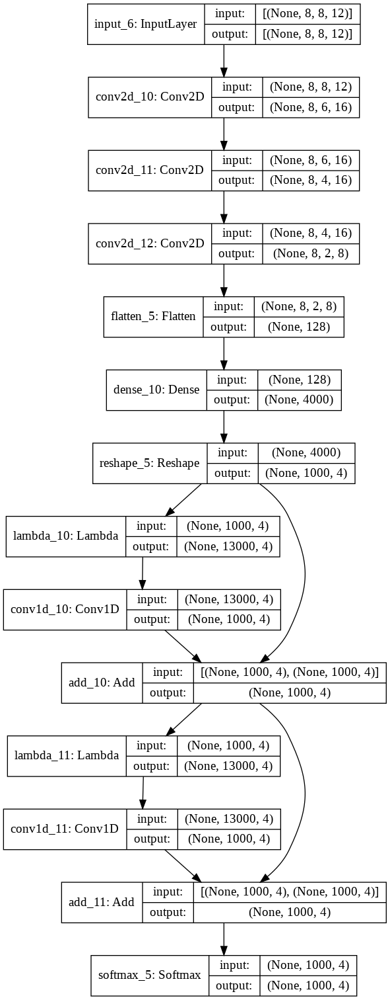

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(inputs)
x = Conv2D(filters = 16, kernel_size = (1, 3), padding = 'valid')(x)
x = Conv2D(filters = 8, kernel_size = (1, 3), padding = 'valid')(x)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv_1(output_block_1)
output_block_2 = add([x, output_block_1])

x = sphere_conv_1(output_block_2)
output_block_3 = add([x, output_block_2])

op = Softmax()(output_block_3)

model = keras.Model(inputs, op)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=50,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/50
127/127 [==============================] - 3s 18ms/step - loss: 0.1628 - val_loss: 0.1209
Epoch 2/50
127/127 [==============================] - 2s 16ms/step - loss: 0.1200 - val_loss: 0.1125
Epoch 3/50
127/127 [==============================] - 2s 16ms/step - loss: 0.1130 - val_loss: 0.1055
Epoch 4/50
127/127 [==============================] - 2s 16ms/step - loss: 0.1064 - val_loss: 0.1016
Epoch 5/50
127/127 [==============================] - 2s 16ms/step - loss: 0.1024 - val_loss: 0.0992
Epoch 6/50
127/127 [==============================] - 2s 16ms/step - loss: 0.0996 - val_loss: 0.0967
Epoch 7/50
127/127 [==============================] - 2s 16ms/step - loss: 0.0978 - val_loss: 0.0948
Epoch 8/50
127/127 [==============================] - 2s 16ms/step - loss: 0.0952 - val_loss: 0.0939
Epoch 9/50
127/127 [==============================] - 2s 16ms/step - loss: 0.0944 - val_loss: 0.0929
Epoch 10/50
127/127 [==============================] - 2s 16ms/step - loss: 0.0934 - val_lo

In [ ]:
load_data(i = [0, 0.01], y = [0.9, 1], flatten = False, fourier = True,
          norm = True, polarization = True)

curves = curves.reshape((-1,8,8,12))

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
conv2d_18 (Conv2D)              (None, 8, 8, 16)     208         input_9[0][0]                    
__________________________________________________________________________________________________
conv2d_19 (Conv2D)              (None, 8, 8, 4)      68          conv2d_18[0][0]                  
__________________________________________________________________________________________________
flatten_8 (Flatten)             (None, 256)          0           conv2d_19[0][0]                  
____________________________________________________________________________________________

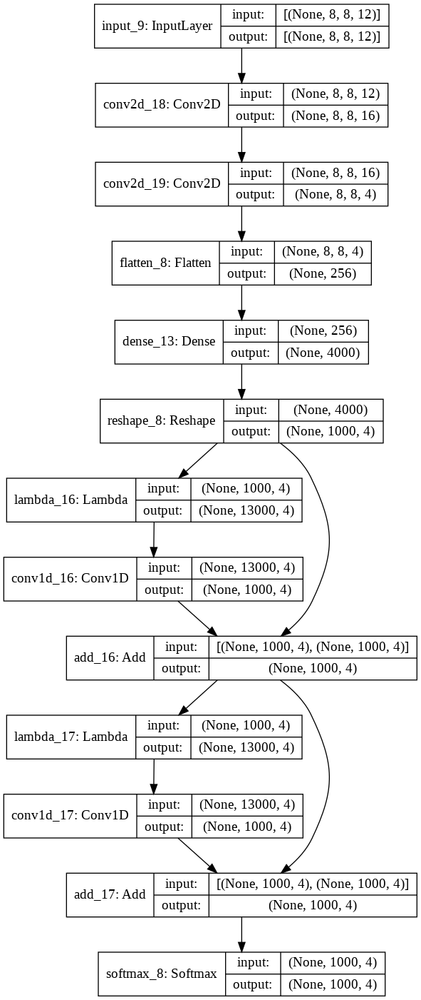

In [ ]:

inputs = keras.Input(shape=(8, 11, 12))
x = Conv2D(filters = 16, kernel_size = (1, 4), padding = 'valid')(inputs)
x = Conv2D(filters = 4, kernel_size = (1, 2), padding = 'valid')(x)
# x = Conv2D(filters = 1, kernel_size = (1, 1), padding = 'valid')(x)
# x = Conv2D(filters = 8, kernel_size = (1), padding = 'valid')(x)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv_1(output_block_1)
output_block_2 = add([x, output_block_1])

x = sphere_conv_1(output_block_2)
output_block_3 = add([x, output_block_2])

op = Softmax()(output_block_3)

model = keras.Model(inputs, op)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=50,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/50
127/127 [==============================] - 3s 19ms/step - loss: 0.1638 - val_loss: 0.1137
Epoch 2/50
127/127 [==============================] - 2s 17ms/step - loss: 0.1117 - val_loss: 0.1021
Epoch 3/50
127/127 [==============================] - 2s 17ms/step - loss: 0.1027 - val_loss: 0.0984
Epoch 4/50
127/127 [==============================] - 2s 17ms/step - loss: 0.0993 - val_loss: 0.0959
Epoch 5/50
127/127 [==============================] - 2s 17ms/step - loss: 0.0966 - val_loss: 0.0941
Epoch 6/50
127/127 [==============================] - 2s 17ms/step - loss: 0.0950 - val_loss: 0.0928
Epoch 7/50
127/127 [==============================] - 2s 17ms/step - loss: 0.0931 - val_loss: 0.0919
Epoch 8/50
127/127 [==============================] - 2s 17ms/step - loss: 0.0923 - val_loss: 0.0912
Epoch 9/50
127/127 [==============================] - 2s 17ms/step - loss: 0.0917 - val_loss: 0.0906
Epoch 10/50
127/127 [==============================] - 2s 17ms/step - loss: 0.0907 - val_lo

#### New Stuff

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
lambda_41 (Lambda)              (None, 8, 10, 12)    0           input_12[0][0]                   
__________________________________________________________________________________________________
conv2d_20 (Conv2D)              (None, 8, 8, 16)     592         lambda_41[0][0]                  
__________________________________________________________________________________________________
lambda_42 (Lambda)              (None, 8, 10, 16)    0           conv2d_20[0][0]                  
____________________________________________________________________________________________

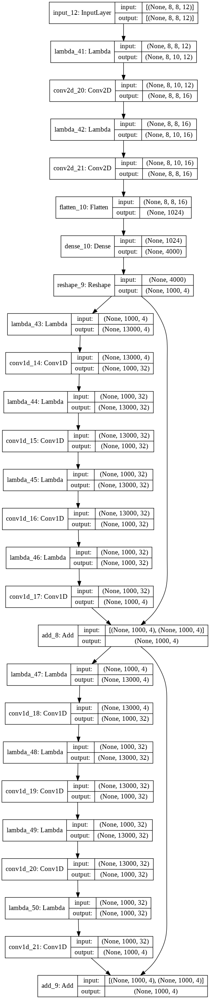

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = conv_curves(inputs, kernel_size = 3, filters = 16)
x = conv_curves(x, kernel_size = 3, filters = 16)


x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 32)
x = sphere_conv(x, rings = 1, filters = 32)
x = sphere_conv(x, rings = 1, filters = 32)
x = sphere_conv(x, rings = 0, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 32)
x = sphere_conv(x, rings = 1, filters = 32)
x = sphere_conv(x, rings = 1, filters = 32)
x = sphere_conv(x, rings = 0, filters = 4)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/150
127/127 [==============================] - 29s 210ms/step - loss: 0.1482 - val_loss: 0.0974
Epoch 2/150
127/127 [==============================] - 26s 206ms/step - loss: 0.0976 - val_loss: 0.0943
Epoch 3/150
127/127 [==============================] - 26s 206ms/step - loss: 0.0947 - val_loss: 0.0923
Epoch 4/150
127/127 [==============================] - 26s 206ms/step - loss: 0.0932 - val_loss: 0.0907
Epoch 5/150
127/127 [==============================] - 26s 206ms/step - loss: 0.0919 - val_loss: 0.0904
Epoch 6/150
127/127 [==============================] - 26s 207ms/step - loss: 0.0916 - val_loss: 0.0896
Epoch 7/150
127/127 [==============================] - 26s 206ms/step - loss: 0.0908 - val_loss: 0.0888
Epoch 8/150
127/127 [==============================] - 26s 206ms/step - loss: 0.0893 - val_loss: 0.0885
Epoch 9/150
127/127 [==============================] - 26s 205ms/step - loss: 0.0890 - val_loss: 0.0882
Epoch 10/150
127/127 [==============================] - 26s 205m

KeyboardInterrupt: ignored

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
lambda_4 (Lambda)               (None, 8, 10, 12)    0           input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 8, 8, 16)     592         lambda_4[0][0]                   
__________________________________________________________________________________________________
lambda_5 (Lambda)               (None, 8, 10, 16)    0           conv2d_2[0][0]                   
____________________________________________________________________________________________

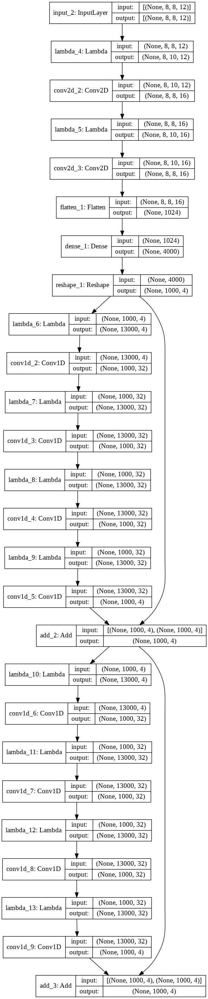

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = conv_curves(inputs, kernel_size = 3, filters = 16)
x = conv_curves(x, kernel_size = 3, filters = 16)


x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 32, activation = 'relu')
x = sphere_conv(x, rings = 1, filters = 32, activation = 'relu')
x = sphere_conv(x, rings = 1, filters = 32, activation = 'relu')
x = sphere_conv(x, rings = 1, filters = 4, activation = 'relu')
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 32, activation = 'relu')
x = sphere_conv(x, rings = 1, filters = 32, activation = 'relu')
x = sphere_conv(x, rings = 1, filters = 32, activation = 'relu')
x = sphere_conv(x, rings = 1, filters = 4, activation = 'relu')
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
load_data(i = [0, 0.01], y = [0.75, 1], flatten = False, fourier = True,
          norm = True, polarization = True)
curves = curves.reshape((-1, 8, 8, 12))

curves:  (18147, 8, 8, 6, 2)
combos:  (18147, 4)
axes:    (18147, 3)
stypes:  (18147, 1000, 4)


In [ ]:
model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/150
256/256 [==============================] - 77s 292ms/step - loss: 0.1390 - val_loss: 0.1004
Epoch 2/150
256/256 [==============================] - 76s 297ms/step - loss: 0.1008 - val_loss: 0.0979
Epoch 3/150
256/256 [==============================] - 76s 297ms/step - loss: 0.0988 - val_loss: 0.0967
Epoch 4/150
256/256 [==============================] - 76s 297ms/step - loss: 0.0972 - val_loss: 0.0961
Epoch 5/150
256/256 [==============================] - 76s 296ms/step - loss: 0.0964 - val_loss: 0.0953
Epoch 6/150
256/256 [==============================] - 76s 296ms/step - loss: 0.0953 - val_loss: 0.0948
Epoch 7/150
256/256 [==============================] - 76s 296ms/step - loss: 0.0948 - val_loss: 0.0943
Epoch 8/150
256/256 [==============================] - 76s 296ms/step - loss: 0.0942 - val_loss: 0.0945
Epoch 9/150
256/256 [==============================] - 76s 296ms/step - loss: 0.0937 - val_loss: 0.0937
Epoch 10/150
256/256 [==============================] - 76s 297m

KeyboardInterrupt: ignored

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = conv_curves(inputs, kernel_size = 3, filters = 16)
x = conv_curves(x, kernel_size = 3, filters = 16)


x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=150,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = conv_curves(inputs, kernel_size = 3, filters = 16)
x = conv_curves(x, kernel_size = 3, filters = 16)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

#### New Stuff 2

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
lambda_26 (Lambda)              (None, 8, 10, 12)    0           input_6[0][0]                    
__________________________________________________________________________________________________
conv2d_10 (Conv2D)              (None, 8, 8, 16)     592         lambda_26[0][0]                  
__________________________________________________________________________________________________
lambda_27 (Lambda)              (None, 8, 10, 16)    0           conv2d_10[0][0]                  
____________________________________________________________________________________________

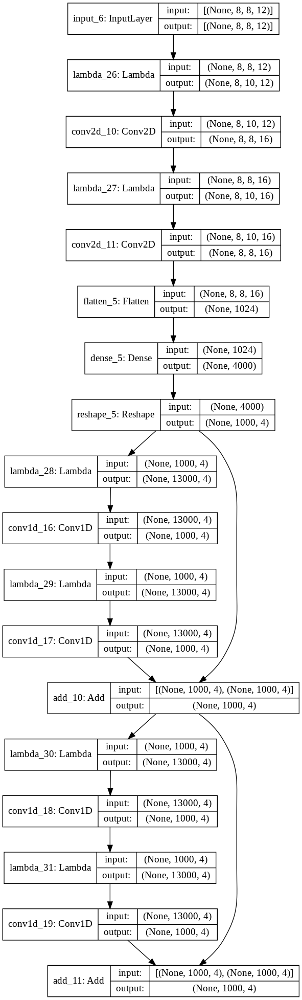

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = conv_curves(inputs, kernel_size = 3, filters = 16)
x = conv_curves(x, kernel_size = 3, filters = 16)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
x = sphere_conv(x, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
x = sphere_conv(x, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=200,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/200
64/64 [==============================] - 4s 44ms/step - loss: 0.2065 - val_loss: 0.1297
Epoch 2/200
64/64 [==============================] - 2s 35ms/step - loss: 0.1264 - val_loss: 0.1032
Epoch 3/200
64/64 [==============================] - 2s 35ms/step - loss: 0.1024 - val_loss: 0.0945
Epoch 4/200
64/64 [==============================] - 2s 35ms/step - loss: 0.0949 - val_loss: 0.0902
Epoch 5/200
64/64 [==============================] - 2s 35ms/step - loss: 0.0910 - val_loss: 0.0873
Epoch 6/200
64/64 [==============================] - 2s 35ms/step - loss: 0.0885 - val_loss: 0.0855
Epoch 7/200
64/64 [==============================] - 2s 36ms/step - loss: 0.0864 - val_loss: 0.0842
Epoch 8/200
64/64 [==============================] - 2s 35ms/step - loss: 0.0846 - val_loss: 0.0834
Epoch 9/200
64/64 [==============================] - 2s 36ms/step - loss: 0.0828 - val_loss: 0.0821
Epoch 10/200
64/64 [==============================] - 2s 36ms/step - loss: 0.0820 - val_loss: 0.0809

In [ ]:
load_data(i = 0, axis_idx = 0, fourier = False, norm = True)

curves:  (9054, 8, 8, 6)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)


Curve Convolutions with Filter = 1

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 8, 8, 6)]    0                                            
__________________________________________________________________________________________________
lambda_10 (Lambda)              (None, 8, 8, 6)      0           input_5[0][0]                    
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, 8, 8, 16)     112         lambda_10[0][0]                  
__________________________________________________________________________________________________
lambda_11 (Lambda)              (None, 8, 8, 16)     0           conv2d_4[0][0]                   
____________________________________________________________________________________________

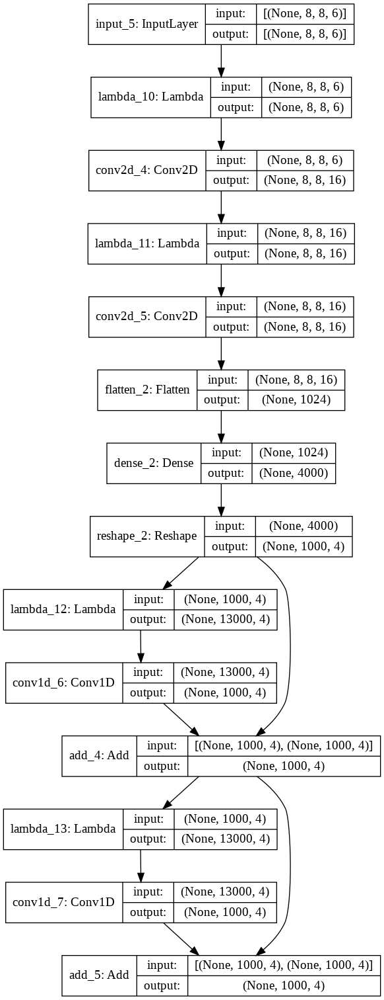

In [ ]:
inputs = keras.Input(shape=(8, 8, 6))
x = conv_curves(inputs, kernel_size = 1, filters = 16)
x = conv_curves(x, kernel_size = 1, filters = 16)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/250
128/128 [==============================] - 35s 26ms/step - loss: 0.1760 - val_loss: 0.1242
Epoch 2/250
128/128 [==============================] - 3s 23ms/step - loss: 0.1126 - val_loss: 0.1050
Epoch 3/250
128/128 [==============================] - 3s 23ms/step - loss: 0.1016 - val_loss: 0.1017
Epoch 4/250
128/128 [==============================] - 3s 23ms/step - loss: 0.0977 - val_loss: 0.0979
Epoch 5/250
128/128 [==============================] - 3s 23ms/step - loss: 0.0950 - val_loss: 0.0966
Epoch 6/250
128/128 [==============================] - 3s 23ms/step - loss: 0.0939 - val_loss: 0.0947
Epoch 7/250
128/128 [==============================] - 3s 23ms/step - loss: 0.0923 - val_loss: 0.0930
Epoch 8/250
128/128 [==============================] - 3s 23ms/step - loss: 0.0902 - val_loss: 0.0925
Epoch 9/250
128/128 [==============================] - 3s 23ms/step - loss: 0.0897 - val_loss: 0.0914
Epoch 10/250
128/128 [==============================] - 3s 23ms/step - loss: 0.08

Normal Test

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 8, 8, 6)]    0                                            
__________________________________________________________________________________________________
lambda_14 (Lambda)              (None, 8, 10, 6)     0           input_6[0][0]                    
__________________________________________________________________________________________________
conv2d_6 (Conv2D)               (None, 8, 8, 16)     304         lambda_14[0][0]                  
__________________________________________________________________________________________________
lambda_15 (Lambda)              (None, 8, 10, 16)    0           conv2d_6[0][0]                   
____________________________________________________________________________________________

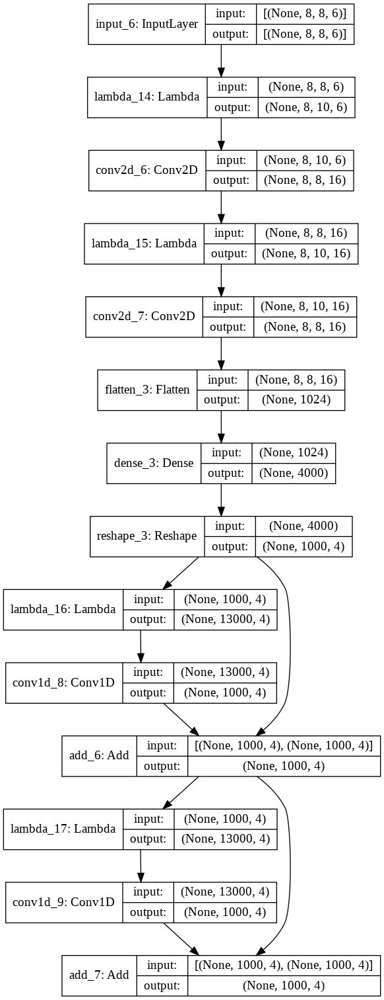

In [ ]:
inputs = keras.Input(shape=(8, 8, 6))
x = conv_curves(inputs, kernel_size = 3, filters = 16)
x = conv_curves(x, kernel_size = 3, filters = 16)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/250
128/128 [==============================] - 4s 26ms/step - loss: 0.1959 - val_loss: 0.1306
Epoch 2/250
128/128 [==============================] - 3s 24ms/step - loss: 0.1180 - val_loss: 0.1033
Epoch 3/250
128/128 [==============================] - 3s 24ms/step - loss: 0.1004 - val_loss: 0.0984
Epoch 4/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0957 - val_loss: 0.0957
Epoch 5/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0934 - val_loss: 0.0933
Epoch 6/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0904 - val_loss: 0.0917
Epoch 7/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0896 - val_loss: 0.0905
Epoch 8/250
128/128 [==============================] - 3s 25ms/step - loss: 0.0882 - val_loss: 0.0904
Epoch 9/250
128/128 [==============================] - 3s 25ms/step - loss: 0.0867 - val_loss: 0.0882
Epoch 10/250
128/128 [==============================] - 3s 25ms/step - loss: 0.085

One Curve Convolution

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 8, 8, 6)]    0                                            
__________________________________________________________________________________________________
lambda_18 (Lambda)              (None, 8, 10, 6)     0           input_7[0][0]                    
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 8, 8, 16)     304         lambda_18[0][0]                  
__________________________________________________________________________________________________
flatten_4 (Flatten)             (None, 1024)         0           conv2d_8[0][0]                   
____________________________________________________________________________________________

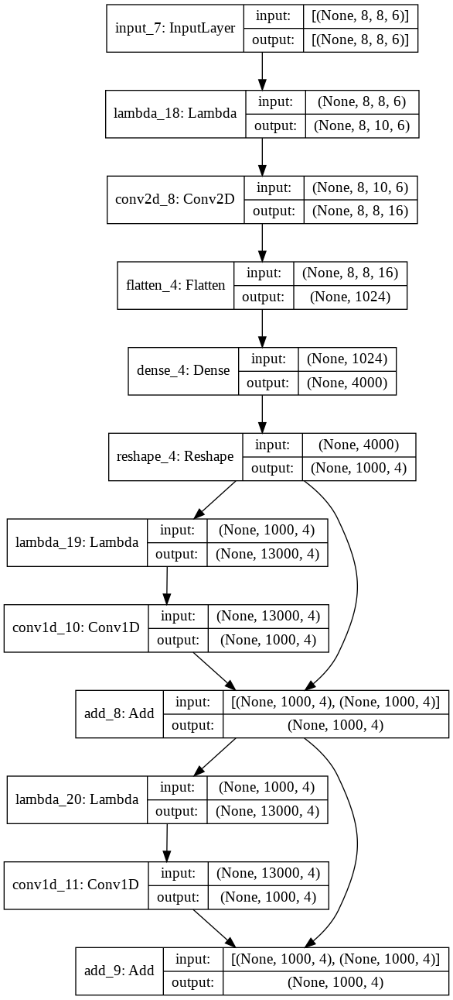

In [ ]:
inputs = keras.Input(shape=(8, 8, 6))
x = conv_curves(inputs, kernel_size = 3, filters = 16)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/250
128/128 [==============================] - 4s 26ms/step - loss: 0.1831 - val_loss: 0.1316
Epoch 2/250
128/128 [==============================] - 3s 24ms/step - loss: 0.1251 - val_loss: 0.1295
Epoch 3/250
128/128 [==============================] - 3s 24ms/step - loss: 0.1068 - val_loss: 0.0996
Epoch 4/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0969 - val_loss: 0.0952
Epoch 5/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0933 - val_loss: 0.0932
Epoch 6/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0899 - val_loss: 0.0919
Epoch 7/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0893 - val_loss: 0.0896
Epoch 8/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0873 - val_loss: 0.0881
Epoch 9/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0860 - val_loss: 0.0882
Epoch 10/250
128/128 [==============================] - 3s 24ms/step - loss: 0.085

Only 8 filters

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 8, 8, 6)]    0                                            
__________________________________________________________________________________________________
lambda_25 (Lambda)              (None, 8, 10, 6)     0           input_9[0][0]                    
__________________________________________________________________________________________________
conv2d_11 (Conv2D)              (None, 8, 8, 8)      152         lambda_25[0][0]                  
__________________________________________________________________________________________________
lambda_26 (Lambda)              (None, 8, 10, 8)     0           conv2d_11[0][0]                  
____________________________________________________________________________________________

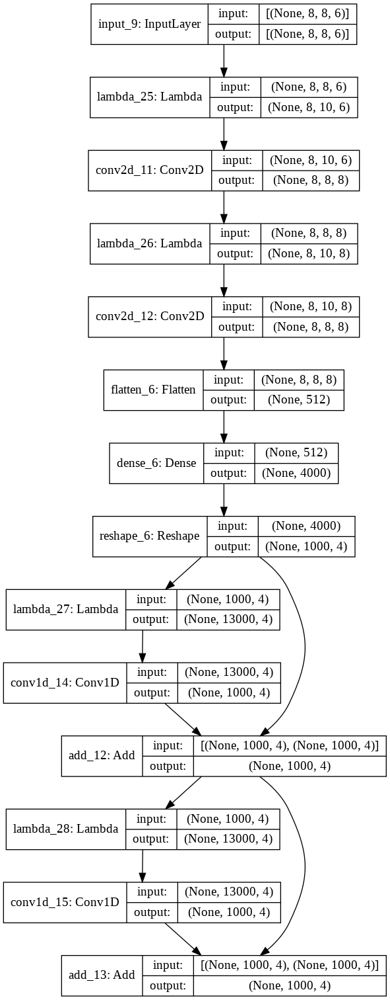

In [ ]:
inputs = keras.Input(shape=(8, 8, 6))
x = conv_curves(inputs, kernel_size = 3, filters = 8)
x = conv_curves(x, kernel_size = 3, filters = 8)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/250
128/128 [==============================] - 3s 21ms/step - loss: 0.1676 - val_loss: 0.1252
Epoch 2/250
128/128 [==============================] - 2s 19ms/step - loss: 0.1143 - val_loss: 0.1034
Epoch 3/250
128/128 [==============================] - 2s 19ms/step - loss: 0.1009 - val_loss: 0.1016
Epoch 4/250
128/128 [==============================] - 2s 19ms/step - loss: 0.0960 - val_loss: 0.0957
Epoch 5/250
128/128 [==============================] - 2s 19ms/step - loss: 0.0937 - val_loss: 0.0936
Epoch 6/250
128/128 [==============================] - 2s 19ms/step - loss: 0.0917 - val_loss: 0.0921
Epoch 7/250
128/128 [==============================] - 2s 19ms/step - loss: 0.0897 - val_loss: 0.0920
Epoch 8/250
128/128 [==============================] - 2s 19ms/step - loss: 0.0891 - val_loss: 0.0902
Epoch 9/250
128/128 [==============================] - 2s 19ms/step - loss: 0.0877 - val_loss: 0.0892
Epoch 10/250
128/128 [==============================] - 2s 19ms/step - loss: 0.087

3 Curve Convolutions

Model: "model_11"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           [(None, 8, 8, 6)]    0                                            
__________________________________________________________________________________________________
lambda_54 (Lambda)              (None, 8, 10, 6)     0           input_15[0][0]                   
__________________________________________________________________________________________________
conv2d_25 (Conv2D)              (None, 8, 8, 16)     304         lambda_54[0][0]                  
__________________________________________________________________________________________________
lambda_55 (Lambda)              (None, 8, 10, 16)    0           conv2d_25[0][0]                  
___________________________________________________________________________________________

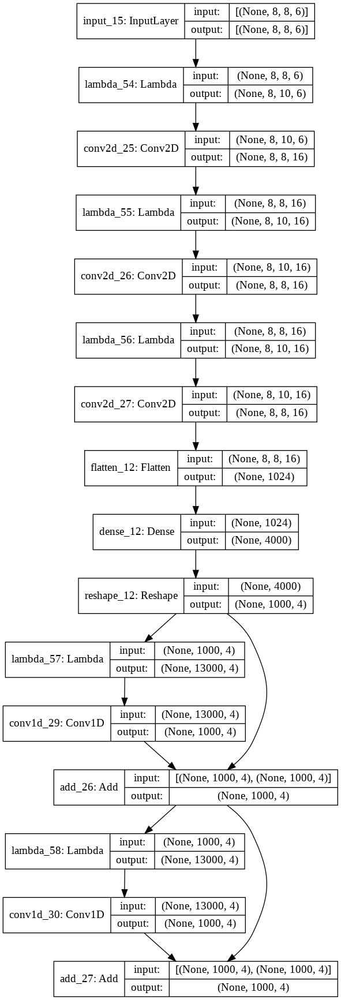

In [ ]:
inputs = keras.Input(shape=(8, 8, 6))
x = conv_curves(inputs, kernel_size = 3, filters = 16)
x = conv_curves(x, kernel_size = 3, filters = 16)
x = conv_curves(x, kernel_size = 3, filters = 16)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/250
128/128 [==============================] - 4s 26ms/step - loss: 0.1982 - val_loss: 0.1266
Epoch 2/250
128/128 [==============================] - 3s 24ms/step - loss: 0.1128 - val_loss: 0.1017
Epoch 3/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0983 - val_loss: 0.0976
Epoch 4/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0942 - val_loss: 0.0936
Epoch 5/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0908 - val_loss: 0.0920
Epoch 6/250
128/128 [==============================] - 3s 25ms/step - loss: 0.0902 - val_loss: 0.0893
Epoch 7/250
128/128 [==============================] - 3s 25ms/step - loss: 0.0868 - val_loss: 0.0880
Epoch 8/250
128/128 [==============================] - 3s 25ms/step - loss: 0.0853 - val_loss: 0.0873
Epoch 9/250
128/128 [==============================] - 3s 25ms/step - loss: 0.0841 - val_loss: 0.0857
Epoch 10/250
128/128 [==============================] - 3s 25ms/step - loss: 0.082

kernel size = 5

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 8, 8, 6)]    0                                            
__________________________________________________________________________________________________
lambda_35 (Lambda)              (None, 8, 12, 6)     0           input_11[0][0]                   
__________________________________________________________________________________________________
conv2d_17 (Conv2D)              (None, 8, 8, 16)     496         lambda_35[0][0]                  
__________________________________________________________________________________________________
lambda_36 (Lambda)              (None, 8, 10, 16)    0           conv2d_17[0][0]                  
____________________________________________________________________________________________

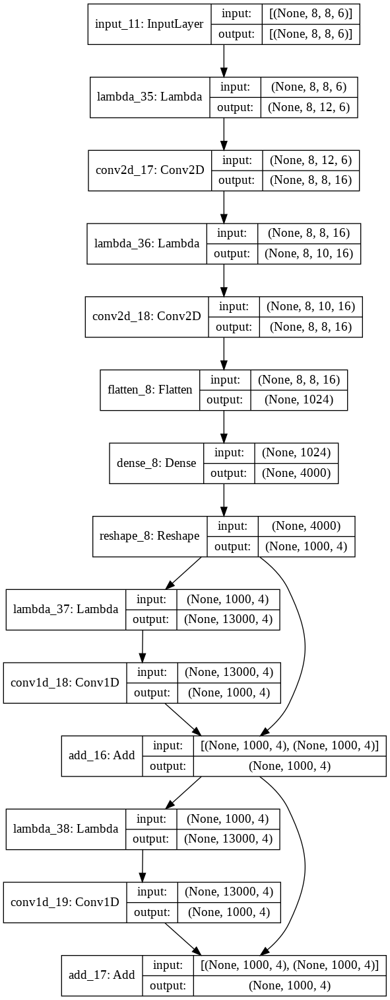

In [ ]:
inputs = keras.Input(shape=(8, 8, 6))
x = conv_curves(inputs, kernel_size = 5, filters = 16)
x = conv_curves(x, kernel_size = 3, filters = 16)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

model = keras.Model(inputs, output_block_3)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/250
128/128 [==============================] - 4s 26ms/step - loss: 0.1830 - val_loss: 0.1284
Epoch 2/250
128/128 [==============================] - 3s 24ms/step - loss: 0.1197 - val_loss: 0.1059
Epoch 3/250
128/128 [==============================] - 3s 24ms/step - loss: 0.1013 - val_loss: 0.1002
Epoch 4/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0968 - val_loss: 0.0952
Epoch 5/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0930 - val_loss: 0.0935
Epoch 6/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0907 - val_loss: 0.0914
Epoch 7/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0892 - val_loss: 0.0897
Epoch 8/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0874 - val_loss: 0.0900
Epoch 9/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0864 - val_loss: 0.0876
Epoch 10/250
128/128 [==============================] - 3s 24ms/step - loss: 0.085

more spherical convolutions

Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           [(None, 8, 8, 6)]    0                                            
__________________________________________________________________________________________________
lambda_45 (Lambda)              (None, 8, 12, 6)     0           input_13[0][0]                   
__________________________________________________________________________________________________
conv2d_22 (Conv2D)              (None, 8, 8, 16)     496         lambda_45[0][0]                  
__________________________________________________________________________________________________
flatten_10 (Flatten)            (None, 1024)         0           conv2d_22[0][0]                  
____________________________________________________________________________________________

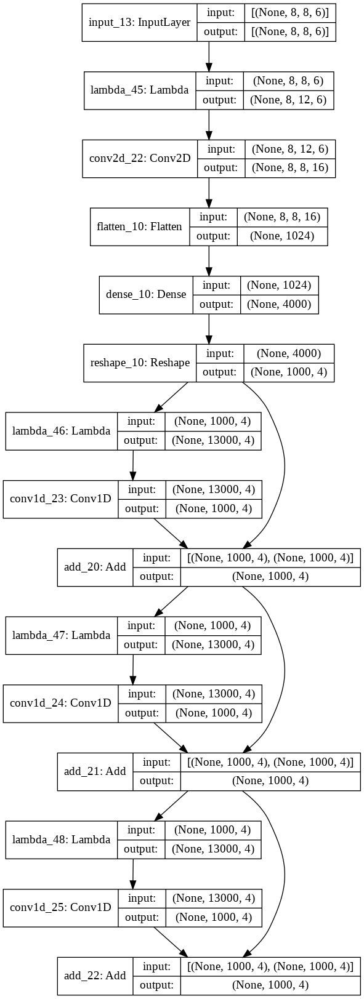

In [ ]:
inputs = keras.Input(shape=(8, 8, 6))
x = conv_curves(inputs, kernel_size = 5, filters = 16)
x = conv_curves(x, kernel_size = 5, filters = 16)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

x = sphere_conv(output_block_3, rings = 1, filters = 4)
output_block_4 = add([x, output_block_3])

model = keras.Model(inputs, output_block_4)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/250
128/128 [==============================] - 5s 30ms/step - loss: 0.2023 - val_loss: 0.1272
Epoch 2/250
128/128 [==============================] - 4s 28ms/step - loss: 0.1130 - val_loss: 0.1014
Epoch 3/250
128/128 [==============================] - 4s 28ms/step - loss: 0.0971 - val_loss: 0.0959
Epoch 4/250
128/128 [==============================] - 4s 28ms/step - loss: 0.0930 - val_loss: 0.0926
Epoch 5/250
128/128 [==============================] - 4s 28ms/step - loss: 0.0905 - val_loss: 0.0905
Epoch 6/250
128/128 [==============================] - 4s 28ms/step - loss: 0.0882 - val_loss: 0.0896
Epoch 7/250
128/128 [==============================] - 4s 28ms/step - loss: 0.0867 - val_loss: 0.0876
Epoch 8/250
128/128 [==============================] - 4s 28ms/step - loss: 0.0856 - val_loss: 0.0873
Epoch 9/250
128/128 [==============================] - 4s 28ms/step - loss: 0.0849 - val_loss: 0.0863
Epoch 10/250
128/128 [==============================] - 4s 28ms/step - loss: 0.083

No spherical convolutions

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 8, 8, 6)]         0         
_________________________________________________________________
lambda (Lambda)              (None, 8, 12, 6)          0         
_________________________________________________________________
conv2d (Conv2D)              (None, 8, 8, 16)          496       
_________________________________________________________________
lambda_1 (Lambda)            (None, 8, 12, 16)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 16)          1296      
_________________________________________________________________
flatten (Flatten)            (None, 1024)              0         
_________________________________________________________________
dense (Dense)                (None, 4000)              410000

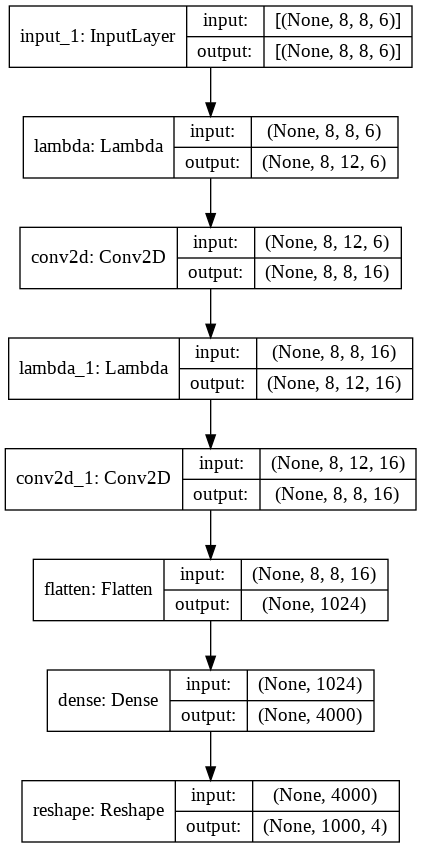

In [ ]:
inputs = keras.Input(shape=(8, 8, 6))
x = conv_curves(inputs, kernel_size = 5, filters = 16)
x = conv_curves(x, kernel_size = 5, filters = 16)

x = Flatten()(x)
x = Dense(4000)(x)
output_block_1 = Reshape((1000,4))(x)

x = sphere_conv(output_block_1, rings = 1, filters = 4)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 4)
output_block_3 = add([x, output_block_2])

x = sphere_conv(output_block_3, rings = 1, filters = 4)
output_block_4 = add([x, output_block_3])

model = keras.Model(inputs, output_block_1)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/250
128/128 [==============================] - 16s 120ms/step - loss: 0.1602 - val_loss: 0.1231
Epoch 2/250
128/128 [==============================] - 15s 116ms/step - loss: 0.1141 - val_loss: 0.1093
Epoch 3/250
128/128 [==============================] - 15s 116ms/step - loss: 0.1051 - val_loss: 0.1029
Epoch 4/250
128/128 [==============================] - 15s 115ms/step - loss: 0.1002 - val_loss: 0.1006
Epoch 5/250
128/128 [==============================] - 15s 116ms/step - loss: 0.0973 - val_loss: 0.0994
Epoch 6/250
128/128 [==============================] - 15s 117ms/step - loss: 0.0966 - val_loss: 0.0977
Epoch 7/250
128/128 [==============================] - 15s 117ms/step - loss: 0.0949 - val_loss: 0.0960
Epoch 8/250
128/128 [==============================] - 15s 117ms/step - loss: 0.0933 - val_loss: 0.0953
Epoch 9/250
128/128 [==============================] - 15s 117ms/step - loss: 0.0930 - val_loss: 0.0951
Epoch 10/250
128/128 [==============================] - 15s 118m

No skips

Model: "model_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        [(None, 8, 8, 6)]         0         
_________________________________________________________________
lambda_59 (Lambda)           (None, 8, 12, 6)          0         
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 8, 8, 16)          496       
_________________________________________________________________
lambda_60 (Lambda)           (None, 8, 12, 16)         0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 8, 8, 16)          1296      
_________________________________________________________________
flatten_13 (Flatten)         (None, 1024)              0         
_________________________________________________________________
dense_13 (Dense)             (None, 4000)              410

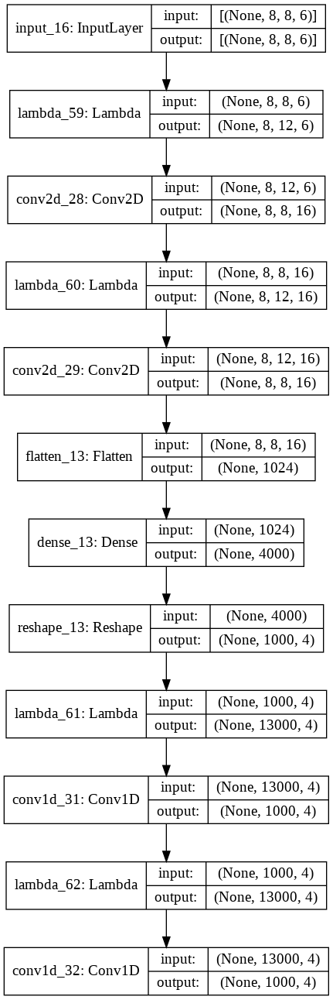

In [ ]:
inputs = keras.Input(shape=(8, 8, 6))
x = conv_curves(inputs, kernel_size = 5, filters = 16)
x = conv_curves(x, kernel_size = 5, filters = 16)

x = Flatten()(x)
x = Dense(4000)(x)
x = Reshape((1000,4))(x)

x = sphere_conv(x, rings = 1, filters = 4)
x = sphere_conv(x, rings = 1, filters = 4)

model = keras.Model(inputs, x)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/250
128/128 [==============================] - 4s 26ms/step - loss: 0.1891 - val_loss: 0.1280
Epoch 2/250
128/128 [==============================] - 3s 24ms/step - loss: 0.1143 - val_loss: 0.1031
Epoch 3/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0994 - val_loss: 0.0990
Epoch 4/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0949 - val_loss: 0.0946
Epoch 5/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0922 - val_loss: 0.0928
Epoch 6/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0900 - val_loss: 0.0909
Epoch 7/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0881 - val_loss: 0.0892
Epoch 8/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0867 - val_loss: 0.0880
Epoch 9/250
128/128 [==============================] - 3s 24ms/step - loss: 0.0863 - val_loss: 0.0882
Epoch 10/250
128/128 [==============================] - 3s 24ms/step - loss: 0.084

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 8, 8, 12)]        0         
_________________________________________________________________
lambda_10 (Lambda)           (None, 8, 12, 12)         0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 8, 8, 16)          976       
_________________________________________________________________
lambda_11 (Lambda)           (None, 8, 12, 16)         0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 8, 8, 16)          1296      
_________________________________________________________________
flatten_3 (Flatten)          (None, 1024)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 8000)              8200

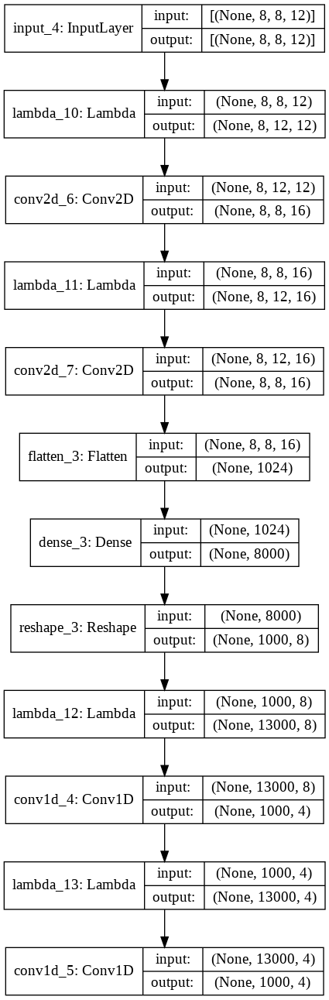

In [ ]:
inputs = keras.Input(shape=(8, 8, 12))
x = conv_curves(inputs, kernel_size = 5, filters = 16)
x = conv_curves(x, kernel_size = 5, filters = 16)

x = Flatten()(x)
x = Dense(8000)(x)
x = Reshape((1000, 8))(x)

x = sphere_conv(x, rings = 1, filters = 4)
x = sphere_conv(x, rings = 1, filters = 4)

model = keras.Model(inputs, x)
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.fit(
    curves,
    stypes,
    epochs=250,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)

Epoch 1/250
128/128 [==============================] - 37s 39ms/step - loss: 0.1809 - val_loss: 0.1064
Epoch 2/250
128/128 [==============================] - 5s 36ms/step - loss: 0.1012 - val_loss: 0.0971
Epoch 3/250
128/128 [==============================] - 5s 36ms/step - loss: 0.0932 - val_loss: 0.0921
Epoch 4/250
128/128 [==============================] - 5s 36ms/step - loss: 0.0883 - val_loss: 0.0883
Epoch 5/250
128/128 [==============================] - 5s 37ms/step - loss: 0.0854 - val_loss: 0.0865
Epoch 6/250
128/128 [==============================] - 5s 37ms/step - loss: 0.0835 - val_loss: 0.0842
Epoch 7/250
128/128 [==============================] - 5s 37ms/step - loss: 0.0813 - val_loss: 0.0831
Epoch 8/250
128/128 [==============================] - 5s 37ms/step - loss: 0.0808 - val_loss: 0.0817
Epoch 9/250
128/128 [==============================] - 5s 37ms/step - loss: 0.0794 - val_loss: 0.0808
Epoch 10/250
128/128 [==============================] - 5s 37ms/step - loss: 0.07

# Results

### Create Models

In [ ]:
def create_model(fourier = True, polarization = True, axis = 0):

    # input shapes:
    if fourier and polarization:
        input_shape = (8,8,12)
    else:
        input_shape = (8,8,6)

    # number of visible facets:
    num_vis_facets = np.sum(visible_facets(axis_idx = axis))

    # ARCHITECTURE:
    # curve convolutions:
    inputs = keras.Input(shape = input_shape)
    x = conv_curves(inputs, kernel_size = 3, filters = 16)
    x = conv_curves(x, kernel_size = 3, filters = 16)

    # dense layer:
    x = Flatten()(x)
    x = Dense(num_vis_facets * 4)(x)
    output_block_1 = Reshape((num_vis_facets,4))(x)

    # spherical convolutions:
    x = sphere_conv(output_block_1, rings = 1, filters = 4, axis = axis)
    output_block_2 = add([x, output_block_1])

    x = sphere_conv(output_block_2, rings = 1, filters = 4, axis = axis)
    output_block_3 = add([x, output_block_2])

    x = sphere_conv(output_block_3, rings = 1, filters = 4, axis = axis)
    output_block_4 = add([x, output_block_3])

    x = sphere_conv(output_block_4, rings = 1, filters = 4, axis = axis)
    output_block_5 = add([x, output_block_4])

    x = sphere_conv(output_block_5, rings = 1, filters = 4, axis = axis)
    output_block_6 = add([x, output_block_5])

    # create and show architecture:
    model = keras.Model(inputs, output_block_6)
    model.compile(optimizer = 'adam', loss='mean_squared_error')

    model.summary()
    keras.utils.plot_model(model, show_shapes=True)

    # # load weights
    # if fourier and polarization:
    #     model.load_weights('models/classification/fourier_pol/axis_' + str(axis))
    # elif fourier and not polarization:
    #     model.load_weights('models/classification/fourier/axis_' + str(axis))
    # elif not fourier:
    #     model.load_weights('models/classification/lambertian/axis_' + str(axis))

    return model

##### Testing

In [ ]:
create_model(axis = 34)

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
lambda_4 (Lambda)               (None, 8, 10, 12)    0           input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, 8, 8, 16)     592         lambda_4[0][0]                   
__________________________________________________________________________________________________
lambda_5 (Lambda)               (None, 8, 10, 16)    0           conv2d_4[0][0]                   
______________________________________________________________________________________________

### Different Geometries

In [ ]:
# CHANGE NNUMBER OF EPOCHS BEFORE UPLOADING!

incl = 0

for axis_ind in [i for i in range(64) if axes[i, 0] >= 0]:

    # print()
    # print()

    axes = np.load('data/axes.npy')
    # print('axis = ' + str(axes[axis_ind]))

    model = create_model(axis = axis_ind)
    load_data(i = incl, axis_idx = axis_ind)

    model.fit(
        curves,
        stypes,
        epochs = 1,
        batch_size = 64,
        validation_split = 0.1,
        callbacks=[keras.callbacks.EarlyStopping(patience=10)]
    )

    # print_confusion(model, curves, stypes)
    model.save_weights('models/classification/fourier_pol/axis' + str(axis_ind)\
                       + '_i' + str(incl))

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
lambda_42 (Lambda)              (None, 8, 10, 12)    0           input_7[0][0]                    
__________________________________________________________________________________________________
conv2d_12 (Conv2D)              (None, 8, 8, 16)     592         lambda_42[0][0]                  
__________________________________________________________________________________________________
lambda_43 (Lambda)              (None, 8, 10, 16)    0           conv2d_12[0][0]                  
____________________________________________________________________________________________

In [ ]:
model = create_model()
load_data(i = 0, axis_idx = 0)

model.fit(
    curves,
    stypes,
    epochs = 1,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model, curves, stypes)
# model.save_weights('models/classification/fourier_with_polarization')

In [ ]:
model.save_weights('models/classification/fourier_with_polarization')

### Different Noise Levels

TRUTH


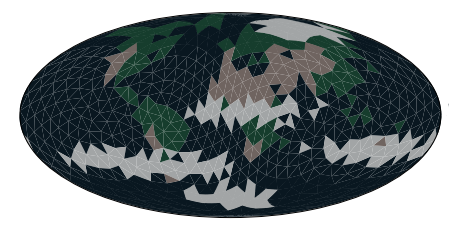

In [ ]:
print('TRUTH')

mollweide(faces, sx_true2)

#### Fourier and Polarization

##### Create Model and Save Weights

In [ ]:
model_fou_pol = create_model(fourier = True, polarization = True, axis = 0)
load_data()

model_fou_pol.fit(
    curves,
    stypes,
    epochs = 250,
    batch_size = 64,
    validation_split = 0.1,
    callbacks = [keras.callbacks.EarlyStopping(patience=10)]
)

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
lambda_18 (Lambda)              (None, 8, 10, 12)    0           input_5[0][0]                    
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 8, 8, 16)     592         lambda_18[0][0]                  
__________________________________________________________________________________________________
lambda_19 (Lambda)              (None, 8, 10, 16)    0           conv2d_8[0][0]                   
____________________________________________________________________________________________

In [ ]:
model_fou_pol.save_weights('models/classification/fourier_pol/axis_0')

##### Test Different Noise Levels

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 8, 8, 12)]   0                                            
__________________________________________________________________________________________________
lambda (Lambda)                 (None, 8, 10, 12)    0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 8, 8, 16)     592         lambda[0][0]                     
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 8, 10, 16)    0           conv2d[0][0]                     
______________________________________________________________________________________________

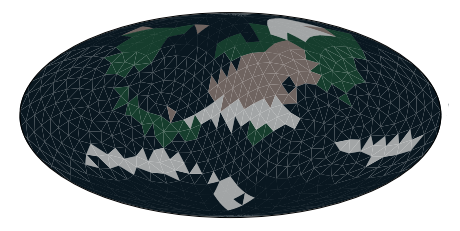



N_MAX = 100000000
curves:  (9054, 8, 8, 12)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0601 - val_loss: 0.0638
Epoch 2/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0600 - val_loss: 0.0636
Epoch 3/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0599 - val_loss: 0.0636
Epoch 4/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0599 - val_loss: 0.0638
Epoch 5/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0599 - val_loss: 0.0637
Epoch 6/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0599 - val_loss: 0.0637
Epoch 7/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0598 - val_loss: 0.0637
Epoch 8/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0599 - val_loss: 0.0637
Epoch 9/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0599 -

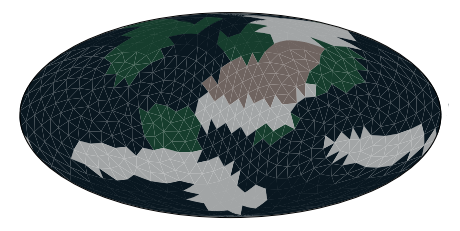



N_MAX = 10000000
curves:  (9054, 8, 8, 12)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0645 - val_loss: 0.0676
Epoch 2/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0637 - val_loss: 0.0671
Epoch 3/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0634 - val_loss: 0.0671
Epoch 4/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0632 - val_loss: 0.0669
Epoch 5/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0631 - val_loss: 0.0667
Epoch 6/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0630 - val_loss: 0.0669
Epoch 7/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0629 - val_loss: 0.0666
Epoch 8/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0628 - val_loss: 0.0665
Epoch 9/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0628 - 

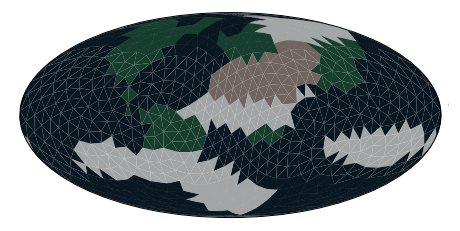



N_MAX = 1000000
curves:  (9054, 8, 8, 12)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0724 - val_loss: 0.0737
Epoch 2/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0700 - val_loss: 0.0728
Epoch 3/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0693 - val_loss: 0.0723
Epoch 4/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0689 - val_loss: 0.0723
Epoch 5/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0686 - val_loss: 0.0718
Epoch 6/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0683 - val_loss: 0.0717
Epoch 7/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0682 - val_loss: 0.0720
Epoch 8/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0681 - val_loss: 0.0715
Epoch 9/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0679 - v

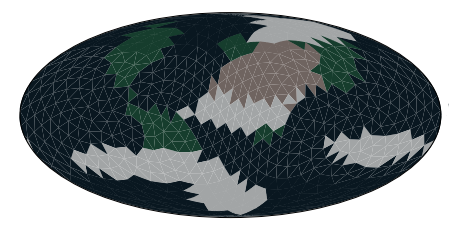



N_MAX = 10000
curves:  (9054, 8, 8, 12)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1203 - val_loss: 0.0966
Epoch 2/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0910 - val_loss: 0.0920
Epoch 3/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0882 - val_loss: 0.0905
Epoch 4/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0869 - val_loss: 0.0896
Epoch 5/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0860 - val_loss: 0.0891
Epoch 6/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0854 - val_loss: 0.0887
Epoch 7/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0849 - val_loss: 0.0887
Epoch 8/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0846 - val_loss: 0.0883
Epoch 9/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0843 - val

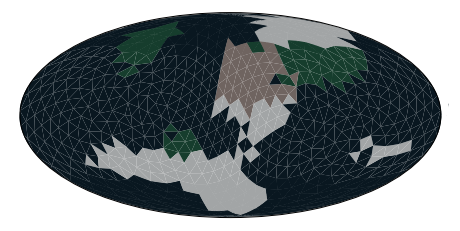



N_MAX = 1000
curves:  (9054, 8, 8, 12)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 42ms/step - loss: 0.1032 - val_loss: 0.1012
Epoch 2/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0979 - val_loss: 0.1005
Epoch 3/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0969 - val_loss: 0.1001
Epoch 4/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0963 - val_loss: 0.0997
Epoch 5/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0958 - val_loss: 0.0996
Epoch 6/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0955 - val_loss: 0.1000
Epoch 7/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0952 - val_loss: 0.0998
Epoch 8/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0950 - val_loss: 0.0998
Epoch 9/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0947 - val_

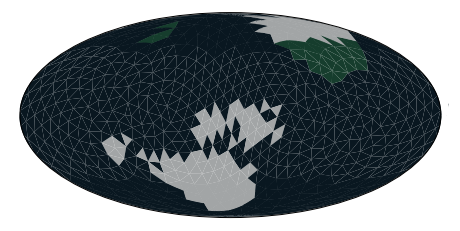



N_MAX = 100
curves:  (9054, 8, 8, 12)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 42ms/step - loss: 0.1217 - val_loss: 0.1209
Epoch 2/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1160 - val_loss: 0.1193
Epoch 3/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1152 - val_loss: 0.1197
Epoch 4/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1143 - val_loss: 0.1190
Epoch 5/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1138 - val_loss: 0.1189
Epoch 6/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1136 - val_loss: 0.1196
Epoch 7/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1133 - val_loss: 0.1192
Epoch 8/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1131 - val_loss: 0.1194
Epoch 9/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1127 - val_l

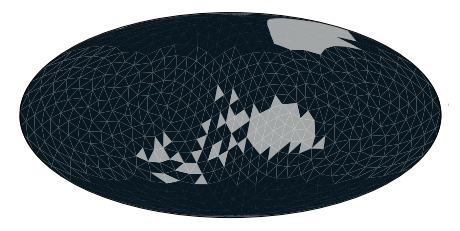



N_MAX = 10
curves:  (9054, 8, 8, 12)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 42ms/step - loss: 0.1507 - val_loss: 0.1487
Epoch 2/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1456 - val_loss: 0.1484
Epoch 3/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1445 - val_loss: 0.1486
Epoch 4/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1436 - val_loss: 0.1493
Epoch 5/50
128/128 [==============================] - 5s 42ms/step - loss: 0.1431 - val_loss: 0.1486
Epoch 6/50
128/128 [==============================] - 5s 42ms/step - loss: 0.1426 - val_loss: 0.1486
Epoch 7/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1423 - val_loss: 0.1490
Epoch 8/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1417 - val_loss: 0.1505
Epoch 9/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1416 - val_lo

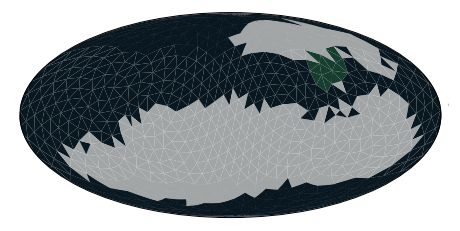

In [ ]:
model_fou_pol = create_model()
load_data()

print('NO NOISE')

model_fou_pol.fit(
    curves,
    stypes,
    epochs = 1,
    batch_size = 64,
    validation_split = 0.1,
    callbacks = [keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model_fou_pol, curves, stypes, val_split = 0.1)

sx_pred = model_fou_pol.predict(c2[:,:,:,:2].reshape((1,8,8,12)))[0]
sx_pred = np.argmax(sx_pred, axis = 1).astype(int)

mollweide(faces, sx_pred)
plt.show()

for N_max in [100000000, 10000000, 1000000, 10000, 1000, 100, 10]:

    print()
    print()
    print('N_MAX = ' + str(N_max))

    load_data(N_max = N_max)

    model_fou_pol.fit(
        curves,
        stypes,
        epochs = 50,
        batch_size = 64,
        validation_split = 0.1,
        callbacks = [keras.callbacks.EarlyStopping(patience=10)]
    )

    # print the confusion matrices:
    print_confusion(model_fou_pol, curves, stypes, val_split = 0.1)

    # show the earth:
    noise_earth_curves = noise_curves(c2[:,:,:,:2], N_max = N_max)
    noise_earth_curves = noise_earth_curves.reshape((1,8,8,12))
    noise_earth_curves = normalize(noise_earth_curves)

    sx_pred = model_fou_pol.predict(noise_earth_curves)[0]
    sx_pred = np.argmax(sx_pred, axis = 1).astype(int)

    mollweide(faces, sx_pred)
    plt.show()

#### Fourier

##### Create Model and Train Weights

In [ ]:
model_fou = create_model(fourier = True, polarization = False)
load_data(polarization = False)

model_fou.fit(
    curves,
    stypes,
    epochs = 250,
    batch_size = 64,
    validation_split = 0.1,
    callbacks = [keras.callbacks.EarlyStopping(patience=10)]
)

Model: "model_13"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_16 (InputLayer)           [(None, 8, 8, 6)]    0                                            
__________________________________________________________________________________________________
lambda_95 (Lambda)              (None, 8, 10, 6)     0           input_16[0][0]                   
__________________________________________________________________________________________________
conv2d_30 (Conv2D)              (None, 8, 8, 16)     304         lambda_95[0][0]                  
__________________________________________________________________________________________________
lambda_96 (Lambda)              (None, 8, 10, 16)    0           conv2d_30[0][0]                  
___________________________________________________________________________________________

In [ ]:
model_fou.save_weights('models/classification/fourier/axis_0')

##### Different Noise Levels

In [ ]:
model_fou = create_model(polarization = False)
load_data(polarization = False)

print('NO NOISE')

model_fou.fit(
    curves,
    stypes,
    epochs = 1,
    batch_size = 64,
    validation_split = 0.1,
    callbacks = [keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model_fou, curves, stypes, val_split = 0.1)

sx_pred = model_fou.predict(c2[:,:,:,0].reshape((1,8,8,6)))[0]
sx_pred = np.argmax(sx_pred, axis = 1).astype(int)

mollweide(faces, sx_pred)
plt.show()

for N_max in [100000000, 10000000, 1000000, 10000, 1000, 100, 10]:

    print()
    print()
    print('N_MAX = ' + str(N_max))

    load_data(N_max = N_max, polarization = False)

    model_fou.fit(
        curves,
        stypes,
        epochs = 50,
        batch_size = 64,
        validation_split = 0.1,
        callbacks = [keras.callbacks.EarlyStopping(patience=10)]
    )

    # print the confusion matrices:
    print_confusion(model_fou, curves, stypes, val_split = 0.1)

    # show the earth:
    noise_earth_curves = noise_curves(c2[:,:,:,0], N_max = N_max,
                                      polarization = False)
    noise_earth_curves = noise_earth_curves.reshape((1,8,8,6))
    noise_earth_curves = normalize(noise_earth_curves)

    sx_pred = model_fou.predict(noise_earth_curves)[0]
    sx_pred = np.argmax(sx_pred, axis = 1).astype(int)

    mollweide(faces, sx_pred)
    plt.show()

NameError: ignored

#### Lambertian

##### Create Model

In [ ]:
model_lamb = create_model(fourier = False, polarization = False, axis = 0)
load_data(polarization = False, fourier = False)

model_lamb.fit(
    curves,
    stypes,
    epochs = 250,
    batch_size = 64,
    validation_split = 0.1,
    callbacks = [keras.callbacks.EarlyStopping(patience=10)]
)

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 8, 8, 6)]    0                                            
__________________________________________________________________________________________________
lambda_7 (Lambda)               (None, 8, 10, 6)     0           input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 8, 8, 16)     304         lambda_7[0][0]                   
__________________________________________________________________________________________________
lambda_8 (Lambda)               (None, 8, 10, 16)    0           conv2d_2[0][0]                   
____________________________________________________________________________________________

In [ ]:
model_lamb.save_weights('models/classification/lambertian/axis_0')

##### Train Model

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 8, 8, 6)]    0                                            
__________________________________________________________________________________________________
lambda_42 (Lambda)              (None, 8, 10, 6)     0           input_7[0][0]                    
__________________________________________________________________________________________________
conv2d_12 (Conv2D)              (None, 8, 8, 16)     304         lambda_42[0][0]                  
__________________________________________________________________________________________________
lambda_43 (Lambda)              (None, 8, 10, 16)    0           conv2d_12[0][0]                  
____________________________________________________________________________________________

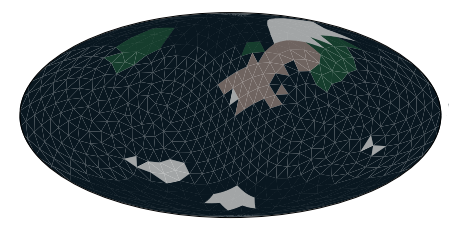



N_MAX = 100000000
curves:  (9054, 8, 8, 6)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0683 - val_loss: 0.0721
Epoch 2/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0684 - val_loss: 0.0722
Epoch 3/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0683 - val_loss: 0.0722
Epoch 4/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0683 - val_loss: 0.0722
Epoch 5/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0682 - val_loss: 0.0720
Epoch 6/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0682 - val_loss: 0.0719
Epoch 7/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0682 - val_loss: 0.0724
Epoch 8/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0682 - val_loss: 0.0718
Epoch 9/50
128/128 [==============================] - 5s 38ms/step - loss: 0.0682 - 

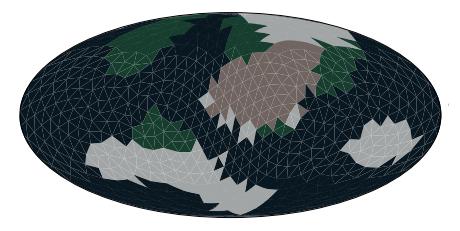



N_MAX = 10000000
curves:  (9054, 8, 8, 6)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0689 - val_loss: 0.0728
Epoch 2/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0688 - val_loss: 0.0726
Epoch 3/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0687 - val_loss: 0.0725
Epoch 4/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0687 - val_loss: 0.0728
Epoch 5/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0687 - val_loss: 0.0726
Epoch 6/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0687 - val_loss: 0.0725
Epoch 7/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0687 - val_loss: 0.0728
Epoch 8/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0686 - val_loss: 0.0725
Epoch 9/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0686 - v

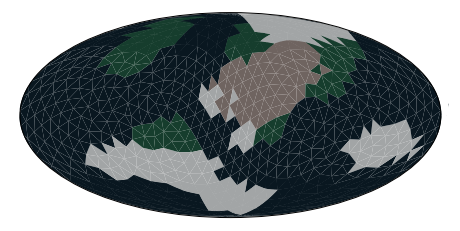



N_MAX = 1000000
curves:  (9054, 8, 8, 6)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 41ms/step - loss: 0.0732 - val_loss: 0.0759
Epoch 2/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0724 - val_loss: 0.0757
Epoch 3/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0720 - val_loss: 0.0757
Epoch 4/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0719 - val_loss: 0.0754
Epoch 5/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0718 - val_loss: 0.0756
Epoch 6/50
128/128 [==============================] - 5s 39ms/step - loss: 0.0717 - val_loss: 0.0754
Epoch 7/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0717 - val_loss: 0.0754
Epoch 8/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0716 - val_loss: 0.0751
Epoch 9/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0715 - va

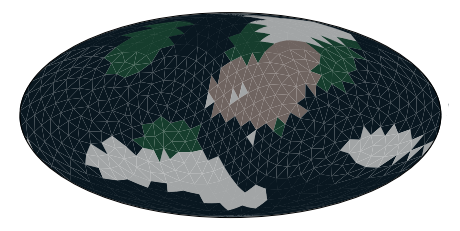



N_MAX = 10000
curves:  (9054, 8, 8, 6)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1092 - val_loss: 0.0940
Epoch 2/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0899 - val_loss: 0.0928
Epoch 3/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0881 - val_loss: 0.0905
Epoch 4/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0873 - val_loss: 0.0901
Epoch 5/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0866 - val_loss: 0.0898
Epoch 6/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0863 - val_loss: 0.0896
Epoch 7/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0860 - val_loss: 0.0901
Epoch 8/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0858 - val_loss: 0.0894
Epoch 9/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0856 - val_

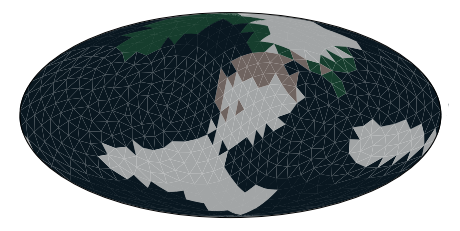



N_MAX = 1000
curves:  (9054, 8, 8, 6)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1053 - val_loss: 0.1032
Epoch 2/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0996 - val_loss: 0.1018
Epoch 3/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0991 - val_loss: 0.1015
Epoch 4/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0981 - val_loss: 0.1031
Epoch 5/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0985 - val_loss: 0.1022
Epoch 6/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0978 - val_loss: 0.1013
Epoch 7/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0977 - val_loss: 0.1016
Epoch 8/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0975 - val_loss: 0.1017
Epoch 9/50
128/128 [==============================] - 5s 40ms/step - loss: 0.0972 - val_l

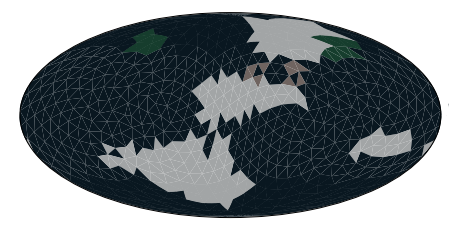



N_MAX = 100
curves:  (9054, 8, 8, 6)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1268 - val_loss: 0.1256
Epoch 2/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1214 - val_loss: 0.1238
Epoch 3/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1203 - val_loss: 0.1258
Epoch 4/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1199 - val_loss: 0.1240
Epoch 5/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1197 - val_loss: 0.1228
Epoch 6/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1194 - val_loss: 0.1237
Epoch 7/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1190 - val_loss: 0.1247
Epoch 8/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1189 - val_loss: 0.1235
Epoch 9/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1185 - val_lo

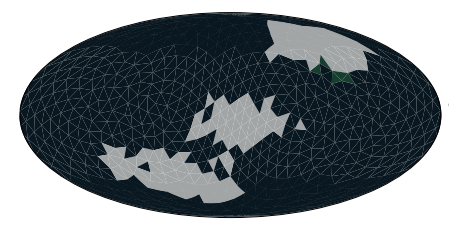



N_MAX = 10
curves:  (9054, 8, 8, 6)
combos:  (9054, 4)
axes:    (9054, 3)
stypes:  (9054, 1000, 4)
Epoch 1/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1495 - val_loss: 0.1478
Epoch 2/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1439 - val_loss: 0.1469
Epoch 3/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1430 - val_loss: 0.1472
Epoch 4/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1423 - val_loss: 0.1467
Epoch 5/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1416 - val_loss: 0.1468
Epoch 6/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1414 - val_loss: 0.1478
Epoch 7/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1410 - val_loss: 0.1474
Epoch 8/50
128/128 [==============================] - 5s 41ms/step - loss: 0.1408 - val_loss: 0.1477
Epoch 9/50
128/128 [==============================] - 5s 40ms/step - loss: 0.1406 - val_los

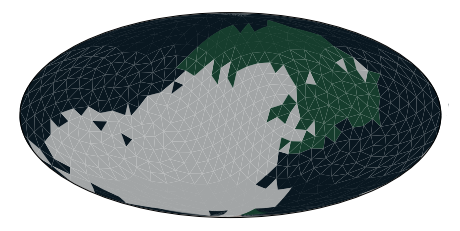

In [ ]:
model_lamb = create_model(polarization = False, fourier = False)
load_data(polarization = False, fourier = False)

print('NO NOISE')

model_lamb.fit(
    curves,
    stypes,
    epochs = 1,
    batch_size = 64,
    validation_split = 0.1,
    callbacks = [keras.callbacks.EarlyStopping(patience=10)]
)

print_confusion(model_lamb, curves, stypes, val_split = 0.1)

sx_pred = model_lamb.predict(c2_lamb.reshape((1,8,8,6)))[0]
sx_pred = np.argmax(sx_pred, axis = 1).astype(int)

mollweide(faces, sx_pred)
plt.show()

for N_max in [100000000, 10000000, 1000000, 10000, 1000, 100, 10]:

    print()
    print()
    print('N_MAX = ' + str(N_max))

    load_data(N_max = N_max, polarization = False, fourier = False)

    model_lamb.fit(
        curves,
        stypes,
        epochs = 50,
        batch_size = 64,
        validation_split = 0.1,
        callbacks = [keras.callbacks.EarlyStopping(patience=10)]
    )

    # print the confusion matrices:
    print_confusion(model_lamb, curves, stypes, val_split = 0.1)

    # show the earth:
    noise_earth_curves = noise_curves(c2_lamb, N_max = N_max,
                                      polarization = False)
    noise_earth_curves = noise_earth_curves.reshape((1,8,8,6))
    noise_earth_curves = normalize(noise_earth_curves)

    sx_pred = model_lamb.predict(noise_earth_curves)[0]
    sx_pred = np.argmax(sx_pred, axis = 1).astype(int)

    mollweide(faces, sx_pred)
    plt.show()

In [ ]:
xs = [100000000, 1000000, 10000, 1000, 10]

losses_fou_pol = []

(8, 8, 6)